# Project Description

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.
b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


Dataset Description:
Number of columns: 23




In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings 
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split

# Loading the Dataset

In [2]:
data=pd.read_csv('weatherAUS.csv')
data

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [3]:
# checking shapes

data.shape

(8425, 23)

In [4]:
# Observations:

# This Dataset has 8425 rows and 23 columns. Let's study the column's names and their charectaristics.

In [5]:
# checking columns names

data.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [6]:
# About the columns-

# 1.Date - The date of observation

# 2.Location -The common name of the location of the weather station

# 3.MinTemp -The minimum temperature in degrees celsius

# 4.MaxTemp -The maximum temperature in degrees celsius

# 5.Rainfall -The amount of rainfall recorded for the day in mm

# 6.Evaporation -The so-called Class A pan evaporation (mm) in the 24 hours to 9am

# 7.Sunshine -The number of hours of bright sunshine in the day.

# 8.WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight

# 9.WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight

# 10.WindDir9am -Direction of the wind at 9am

# 11.WindDir3pm -Direction of the wind at 3pm

# 12.WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am

# 13.WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm

# 14.Humidity9am -Humidity (percent) at 9am

# 15.Humidity3pm -Humidity (percent) at 3pm

# 16.Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am

# 17.Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm

# 18.Cloud9am - Fraction of sky obscured by cloud at 9am.

# 19.Cloud3pm -Fraction of sky obscured by cloud

# 20.Temp9am-Temperature (degrees C) at 9am

# 21.Temp3pm -Temperature (degrees C) at 3pm

# 22.RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0

# 23.RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [8]:
data.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

# Checking duplicate:

In [9]:
#checking duplicate

data.duplicated().sum()

1663

In [10]:
data.drop_duplicates(keep= 'first',inplace= True )

In [11]:
data.shape

(6762, 23)

In [12]:
#checking duplicate after removing

data.duplicated().sum()

0

In [13]:
# Observations

# The dataset is free from duplicates.

# Statistical features:

In [14]:
data.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,6692.000000,6705.000000,6624.000000,3841.000000,3526.000000,5820.000000,6699.000000,6662.000000,6708.000000,6666.000000,5454.000000,5451.000000,4896.000000,4860.000000,6711.000000,6670.000000
mean,13.109145,24.098345,2.780148,5.302395,7.890896,38.977663,12.782206,17.571150,67.506559,50.467147,1017.626311,1015.119923,4.336806,4.320988,17.895038,22.708561
std,5.569574,6.156128,10.591418,4.436790,3.785883,14.418577,9.833499,9.620043,17.251733,18.631086,6.712043,6.646755,2.908324,2.740519,5.744117,6.012896
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.000000,19.500000,0.000000,2.600000,5.400000,30.000000,6.000000,9.000000,56.000000,38.000000,1013.100000,1010.300000,1.000000,1.000000,13.800000,18.300000
50%,13.200000,23.500000,0.000000,4.600000,9.000000,37.000000,11.000000,17.000000,68.000000,50.000000,1017.600000,1015.100000,5.000000,5.000000,18.000000,22.100000
75%,17.500000,28.400000,0.800000,7.000000,10.800000,48.000000,19.000000,24.000000,81.000000,63.000000,1022.200000,1019.600000,7.000000,7.000000,22.200000,26.800000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


In [15]:
data.describe(include=object).T

,count,unique,top,freq
Date,6762,3004,2011-02-11,4
Location,6762,12,PerthAirport,1204
WindGustDir,5820,16,E,518
WindDir9am,5968,16,N,609
WindDir3pm,6468,16,SE,677
RainToday,6624,2,No,5052
RainTomorrow,6624,2,No,5052


In [16]:
# Observations:

# Date column has 3004 unique value. Let's encode it to numerical data.

# Outliers are present in most of the numarical data.

# Seems skewness are present.

# Missing values also present

In [17]:
data['Date'] = pd.to_datetime(data['Date'])
data['year'] = data['Date'].dt.year
data['month'] = data['Date'].dt.month
data['day'] = data['Date'].dt.day

In [18]:
data.drop('Date', axis = 1, inplace = True)
data.head()


,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5


# Differentiate Numerical and Categorical Data:

In [19]:
data.columns.to_series().groupby(data.dtypes).groups

{int64: ['year', 'month', 'day'], float64: ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm'], object: ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']}

In [20]:
# spliting into Numerical & Categorical
# 'year', 'month', 'day' has discrete numarical data

num_features = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 
                'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
                'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm' ]

cat_features = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       6762 non-null   object 
 1   MinTemp        6692 non-null   float64
 2   MaxTemp        6705 non-null   float64
 3   Rainfall       6624 non-null   float64
 4   Evaporation    3841 non-null   float64
 5   Sunshine       3526 non-null   float64
 6   WindGustDir    5820 non-null   object 
 7   WindGustSpeed  5820 non-null   float64
 8   WindDir9am     5968 non-null   object 
 9   WindDir3pm     6468 non-null   object 
 10  WindSpeed9am   6699 non-null   float64
 11  WindSpeed3pm   6662 non-null   float64
 12  Humidity9am    6708 non-null   float64
 13  Humidity3pm    6666 non-null   float64
 14  Pressure9am    5454 non-null   float64
 15  Pressure3pm    5451 non-null   float64
 16  Cloud9am       4896 non-null   float64
 17  Cloud3pm       4860 non-null   float64
 18  Temp9am 

In [22]:
# Observations:

# Among 25 feature, there are total 16 float datatype, 3 int datatype and 6 categorical datatype.

# There is two target variable Rainfall and RainTomorrow.

# Rainfall is a numerical data, needs a Regression model to predict this.

# RainTomorrow is a categorical data, needs a Classification model to predict this.

# Let check if any whitespace, 'NA' or '-' exist in dataset

In [23]:
data.isin([' ','NA','-']).sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
year             0
month            0
day              0
dtype: int64

In [24]:
# Observations:

# No blank space, NA, '-', '?' exist in dataset.

# Checking Null:

In [25]:
#checking null values

null_val= data.isna().sum()
null_val_per =(null_val/data.shape[0])*100
l= [null_val, null_val_per]
print("missing value details \n\n", pd.concat(l, axis =1, keys =['Null Values', 'Null Values percentage']).sort_values('Null Values'))

missing value details 

                Null Values  Null Values percentage
Location                 0                0.000000
year                     0                0.000000
month                    0                0.000000
day                      0                0.000000
Temp9am                 51                0.754215
Humidity9am             54                0.798580
MaxTemp                 57                0.842946
WindSpeed9am            63                0.931677
MinTemp                 70                1.035197
Temp3pm                 92                1.360544
Humidity3pm             96                1.419698
WindSpeed3pm           100                1.478852
Rainfall               138                2.040816
RainTomorrow           138                2.040816
RainToday              138                2.040816
WindDir3pm             294                4.347826
WindDir9am             794               11.742088
WindGustDir            942               13.930790
WindGu

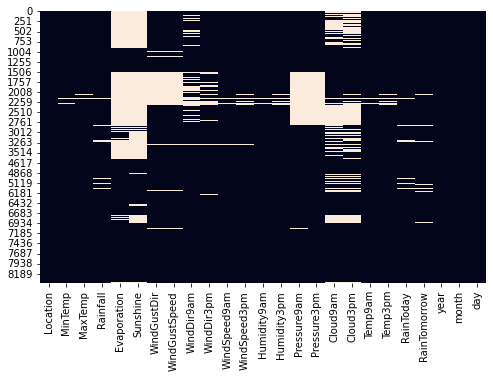

In [26]:
plt.figure(figsize=(8,5))
sns.heatmap(data.isnull(),cbar=False)
plt.show()

In [27]:
# Observations:

# Null values are present in the dataset.

# Among 25 features, every feature except 4 have null values.

# Target variable have also null.

# Location, day, month and year have no null .

# Null value imputation:

# Categorical Data Imputation:

In [28]:
cat= data[['WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday','RainTomorrow']]
for i in cat:
    print("Mode of ",i)
    mode = data[i].mode()[0]
    print(mode)
    print("--------")

Mode of  WindGustDir
E
--------
Mode of  WindDir9am
N
--------
Mode of  WindDir3pm
SE
--------
Mode of  RainToday
No
--------
Mode of  RainTomorrow
No
--------


In [29]:
for i in cat:
    mode = data[i].mode()[0]
    data[i].fillna(mode,inplace=True)

In [30]:
# Observations:

# No null value is present in the categorical data.

# Numerical Data Imputation:

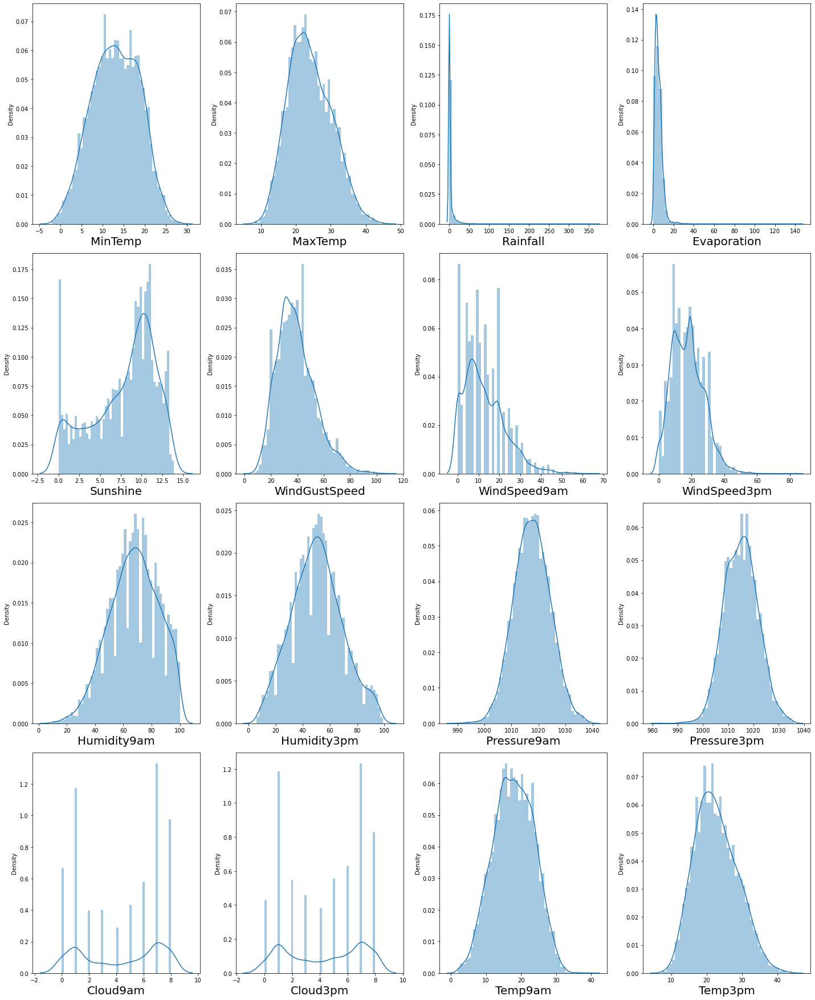

In [31]:
num= ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 
    'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
    'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
i=0
plt.figure(figsize=(20,30))
for x in num:
    plt.subplot(5,4,i+1)
    sns.distplot(data[x], bins=50)
    plt.xlabel(x,fontsize=20)
    i=i+1
plt.tight_layout()

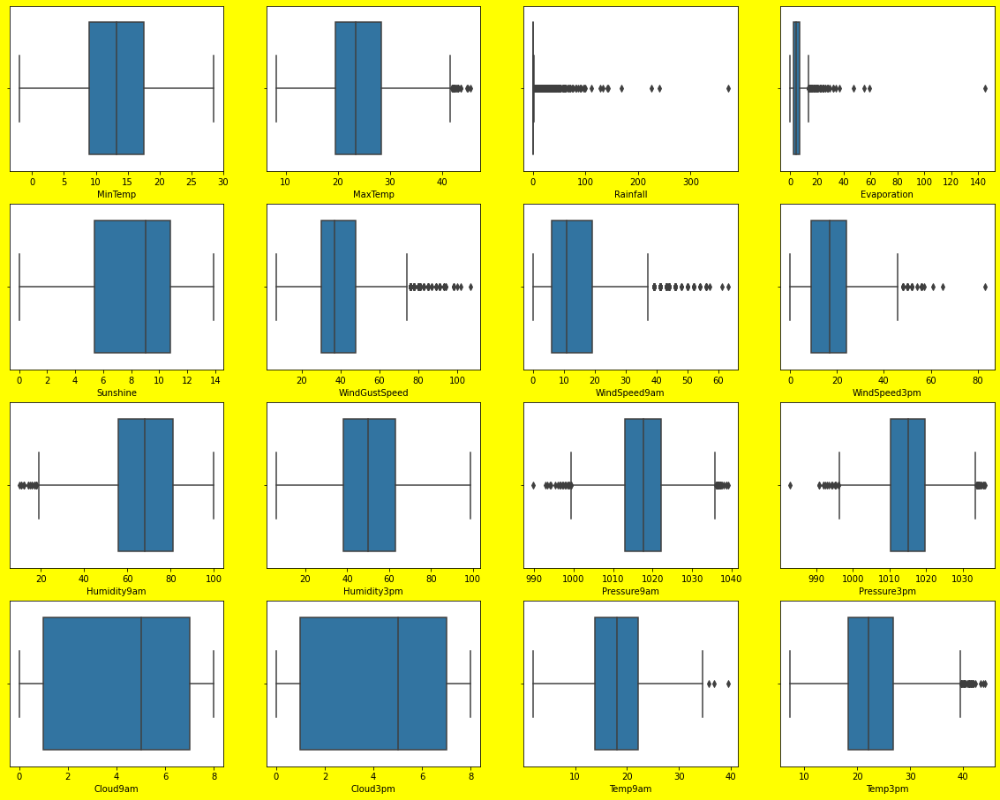

In [32]:
num= ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 
    'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
    'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
plt.figure(figsize=(20,20),facecolor='yellow')
plotnumber=1

for x in num:
    if plotnumber<=16:
        ax=plt.subplot(5,4,plotnumber)
        sns.boxplot(data[x])
        plt.xlabel(x)
    plotnumber+=1
plt.show()

In [33]:
# Observations:

# Data set has outliers, first we will remove the outliers

# Outliers removal:

In [34]:
#1st quantile
q1= data. quantile(0.1)
#3rd quantile
q3= data. quantile(0.85)
#IQR
iqr= q3-q1

In [35]:
data_new = data[~((data < (q1 - 1.5 *iqr)) |(data > (q3 + 1.5 *iqr))).any(axis=1)]
print(data_new.shape)

(6192, 25)


In [36]:
data.shape

(6762, 25)

In [37]:
((data.shape[0] - data_new.shape[0])/data.shape[0])*100

8.429458740017747

In [38]:
# Observations:

# All outliers are removed.

# Let's impute the numerical missing values.

In [39]:
data_new[num].isnull().sum()

MinTemp            64
MaxTemp            55
Rainfall          138
Evaporation      2677
Sunshine         2974
WindGustSpeed     859
WindSpeed9am       56
WindSpeed3pm       93
Humidity9am        51
Humidity3pm        91
Pressure9am      1202
Pressure3pm      1205
Cloud9am         1773
Cloud3pm         1801
Temp9am            48
Temp3pm            87
dtype: int64

In [40]:
num= ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 
    'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
    'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
for i in num:
    print("Mean of ",i,'is')
    mean = data_new[i].mean()
    print(mean)
    print("--------")

Mean of  MinTemp is
12.938071148825086
--------
Mean of  MaxTemp is
24.245853022649488
--------
Mean of  Rainfall is
0.7717707300958002
--------
Mean of  Evaporation is
5.112290184921756
--------
Mean of  Sunshine is
8.143039154754529
--------
Mean of  WindGustSpeed is
38.47515469716857
--------
Mean of  WindSpeed9am is
12.61848109517601
--------
Mean of  WindSpeed3pm is
17.42711919986883
--------
Mean of  Humidity9am is
66.29815990880964
--------
Mean of  Humidity3pm is
49.15423701032618
--------
Mean of  Pressure9am is
1017.8531062124224
--------
Mean of  Pressure3pm is
1015.2447563665517
--------
Mean of  Cloud9am is
4.130798823263182
--------
Mean of  Cloud3pm is
4.164882714643589
--------
Mean of  Temp9am is
17.88948567708335
--------
Mean of  Temp3pm is
22.86570024570026
--------


In [41]:
for i in num:
    mean = data_new[i].mean()
    data_new[i].fillna(mean,inplace=True)

In [42]:
# Observations:

# No null value is present in the numerical data.

# EDA(Exploratory Data Analysis):

# Categorical Data Analysis:

In [44]:
cat= ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']
for i in cat:
    x= data_new[i].value_counts()
    print("Value counts of", i, "is---\n",x)
    print("="*20)

Value counts of Location is---
 PerthAirport    1119
Albury           844
Melbourne        761
Newcastle        751
CoffsHarbour     537
Williamtown      531
Brisbane         523
Penrith          449
Darwin           236
Wollongong       212
Adelaide         190
Uluru             39
Name: Location, dtype: int64
Value counts of WindGustDir is---
 E      1345
N       436
SW      413
W       403
WNW     365
WSW     363
SSE     343
ENE     342
S       334
SE      331
NE      283
NNE     274
NW      272
SSW     272
ESE     243
NNW     173
Name: WindGustDir, dtype: int64
Value counts of WindDir9am is---
 N      1313
SW      509
NW      430
SE      407
ENE     382
NE      345
WSW     331
E       324
NNE     322
SSW     321
S       284
SSE     281
WNW     269
W       265
ESE     207
NNW     202
Name: WindDir9am, dtype: int64
Value counts of WindDir3pm is---
 SE     877
WSW    456
NE     456
S      449
SW     391
SSE    375
NW     366
E      359
WNW    358
W      358
N      335
ESE    329
ENE  

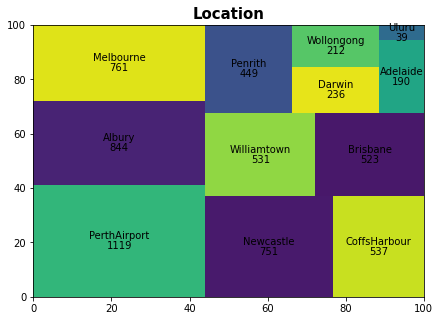

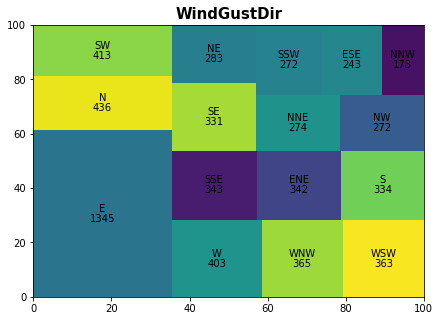

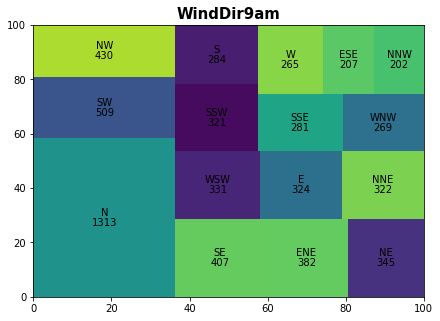

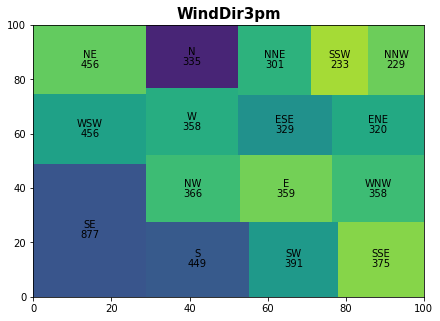

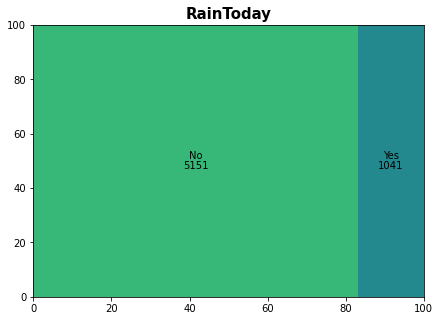

In [45]:
import squarify
for i in cat:
    plt.figure(figsize=(7,5))
    reln = data_new[i].value_counts()
    squarify.plot(sizes=reln.values, value=reln.values, label=reln.index)
    plt.title(i, fontdict={'fontsize': 15, 'fontweight': 'bold'})
    plt.show()

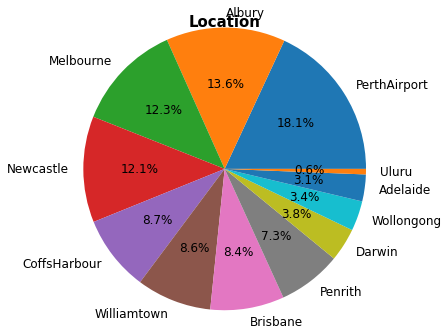

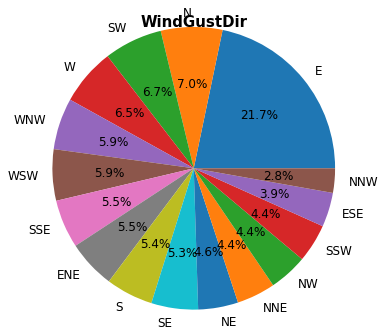

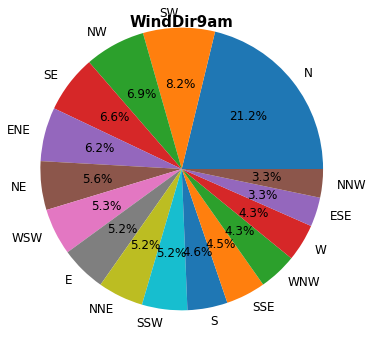

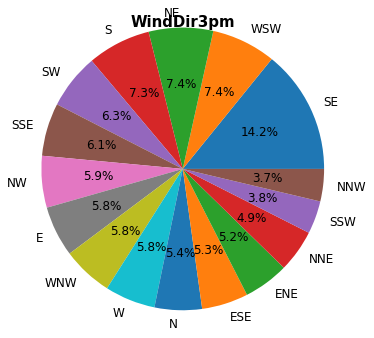

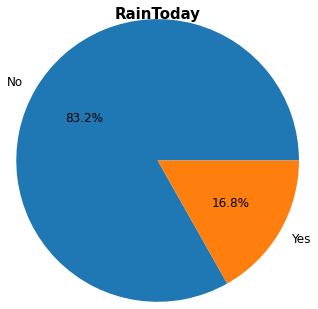

In [46]:
for i in cat:
    plt.figure(figsize=(5,5))
    data_new[i].value_counts().plot.pie(radius =1.3, textprops ={ 'fontsize':12}, autopct='%2.1f%%')
    plt.title(i,fontsize =15,fontweight ='bold')
    plt.ylabel(' ')
    plt.show()

In [47]:
# Observations:

# Around 18.1% location is PerthAirport.

# Maximum WindGustDir is E that is the direction of the strongest wind gust in the 24 hours to midnight is East direction.

# Around 21.2% WindDir9am is N (North).

# Around 14.2% WindDir3pm is SE (South East).

# RainToday has 'No' percentage 83.2%.


# Analysis of Numerical variable:

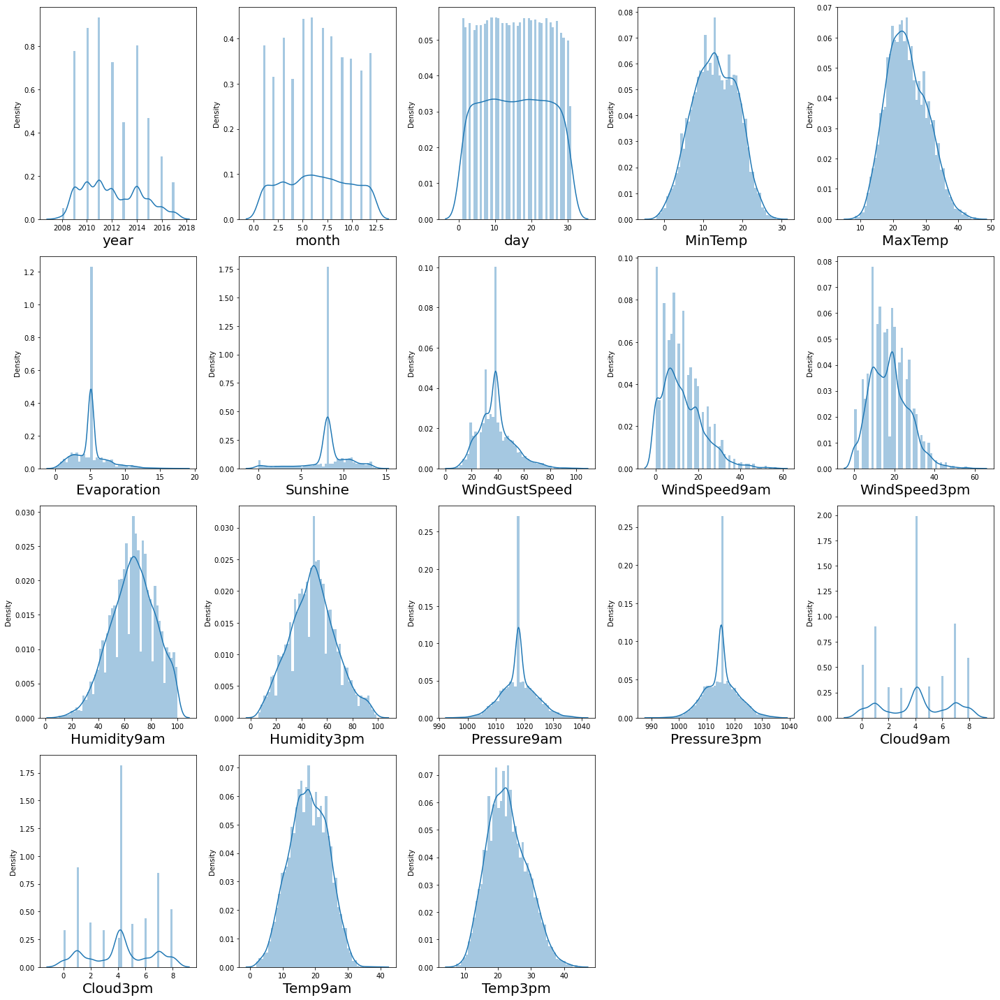

In [48]:
num= ['year', 'month', 'day', 'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed', 
      'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am',
      'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
i=0
plt.figure(figsize=(20,20))
for x in num:
    plt.subplot(4,5,i+1)
    sns.distplot(data_new[x], bins=50)
    plt.xlabel(x,fontsize=20)
    i=i+1
plt.tight_layout()

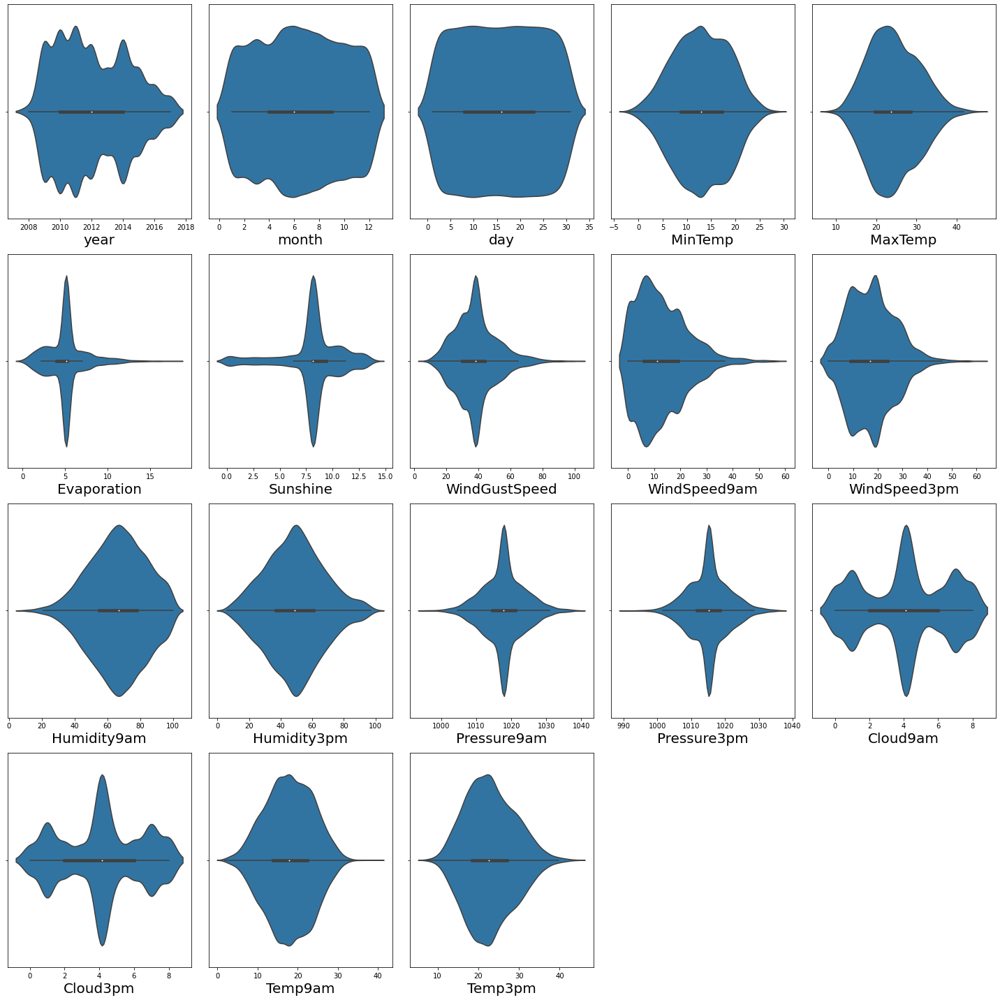

In [49]:
num= ['year', 'month', 'day', 'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed', 
      'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am',
      'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
i=0
plt.figure(figsize=(20,20))
for x in num:
    plt.subplot(4,5,i+1)
    sns.violinplot(data_new[x])
    plt.xlabel(x,fontsize=20)
    i=i+1
plt.tight_layout()

In [50]:
# Observations:

# Min temp range is around 0-25.

# MaxTemp range is around 10-40.

# For maximum case the evporation value is 5.

# Range of WindGustSpeed is 10-80.

# Humidity9am and Humidity3pm is in the range 0-100

# Pressure9am and Pressure3pm is 1000-1030

# Temparature range is 0-40 for both variation.

# Analysis of Target variable:


# 1. RainTomorrow (target1):

In [51]:
data_new["RainTomorrow"].value_counts()

No     4938
Yes    1254
Name: RainTomorrow, dtype: int64

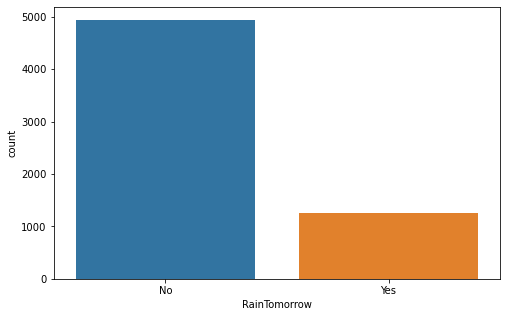

In [52]:
plt.figure(figsize=(8,5))
sns.countplot(data_new["RainTomorrow"])
plt.show()

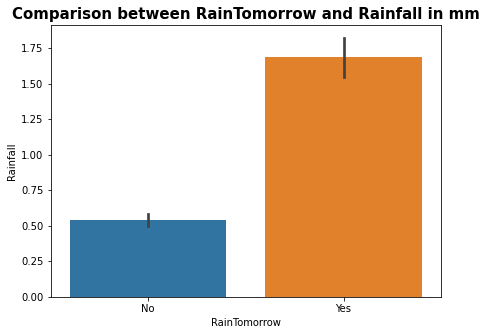

In [53]:
plt.figure(figsize=(7,5))
sns.barplot(x = "RainTomorrow", y = "Rainfall", data = data_new)
plt.title('Comparison between RainTomorrow and Rainfall in mm', fontsize=15, fontweight='bold')
plt.show()

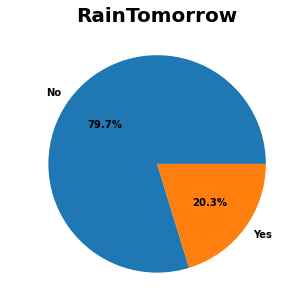

In [54]:
plt.subplots(figsize=(8,5))
data_new['RainTomorrow'].value_counts().plot.pie(autopct='%2.1f%%', textprops ={ 'fontweight': 'bold','fontsize':10})
plt.title('RainTomorrow', fontsize=20,fontweight ='bold')
plt.ylabel( ' ')
plt.show()


In [55]:
# Observations:

# 79.7% data has No outcomes for Raintomorrow.

# The chance of rainnig tomorrow is less.

# If rainfall range in between 0-0.50, the chance for raining tomorrow is No, otherwise it is Yes.

# Outliers are present in the dataset.

# The dataset is imbalance with respect to target variable 1 which is RainTomorrow.

# 2. Rainfall (target2):

In [56]:
print('Maximum Rainfall value is:',data_new.Rainfall.max(),"mm")
print('Minimum Rainfall value is:',data_new.Rainfall.min(),"mm")
print('Mean Rainfall value is:',data_new.Rainfall.mean(),"mm")
print('Sum of the Rainfall value is:',data_new.Rainfall.sum(),"mm")

Maximum Rainfall value is: 10.0 mm
Minimum Rainfall value is: 0.0 mm
Mean Rainfall value is: 0.7717707300957997 mm
Sum of the Rainfall value is: 4778.80436075322 mm


In [57]:
print ('The number of values with maximum Rainfall', data_new['Rainfall'].value_counts()[10.0])

The number of values with maximum Rainfall 10


In [58]:
print ('The number of values with minimum Rainfall', data_new['Rainfall'].value_counts()[0.0])

The number of values with minimum Rainfall 4299


In [59]:
print(" Details of maximum Rainfall value which is 10.0 mm:\n")

data_new.loc[data_new.Rainfall==10.0]

 Details of maximum Rainfall value which is 10.0 mm:



,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
675,Albury,7.3,15.9,10.0,5.11229,8.143039,WSW,46.000000,W,WSW,...,1020.700000,4.130799,4.164883,10.0,15.5000,Yes,No,2010,10,7
1130,CoffsHarbour,12.0,22.6,10.0,6.00000,11.900000,E,28.000000,WSW,E,...,1024.400000,2.000000,2.000000,19.2,22.0000,Yes,No,2009,10,19
1345,CoffsHarbour,11.4,21.0,10.0,3.60000,9.100000,SW,35.000000,SW,SE,...,1015.244756,1.000000,4.164883,16.8,22.8657,Yes,No,2010,5,22
1852,Newcastle,10.8,21.0,10.0,5.11229,8.143039,E,38.475155,N,SE,...,1015.244756,5.000000,6.000000,15.2,20.1000,Yes,No,2014,5,9
2052,Newcastle,22.2,28.7,10.0,5.11229,8.143039,E,38.475155,N,SE,...,1015.244756,8.000000,8.000000,25.5,21.8000,Yes,No,2014,11,25
2209,Newcastle,12.7,20.4,10.0,5.11229,8.143039,E,38.475155,N,SE,...,1015.244756,8.000000,7.000000,16.0,18.5000,Yes,Yes,2015,5,1
2436,Penrith,9.1,20.9,10.0,5.11229,8.143039,NNE,17.000000,N,ESE,...,1015.244756,4.130799,4.164883,11.7,20.1000,Yes,No,2014,8,24
2873,Williamtown,18.7,26.2,10.0,8.80000,8.143039,WSW,48.000000,SSE,ESE,...,1011.100000,7.000000,7.000000,23.4,24.0000,Yes,Yes,2015,12,10
6445,Brisbane,21.3,32.9,10.0,3.20000,10.200000,W,33.000000,SSW,W,...,999.100000,6.000000,4.000000,27.2,32.4000,Yes,No,2011,12,12
7101,PerthAirport,10.3,19.5,10.0,2.20000,4.900000,WSW,48.000000,NNE,WNW,...,1017.000000,7.000000,5.000000,13.2,17.2000,Yes,Yes,2011,6,15


In [60]:
# Observations:

# Min rainfall is 0 mm and maximim is 10.0 mm.

# The number of data with maximum Rainfall (10.0 mm) is 10.

# Most of the case the location of 10.0 mm rainfall is Newcastle and CoffsHarbour.

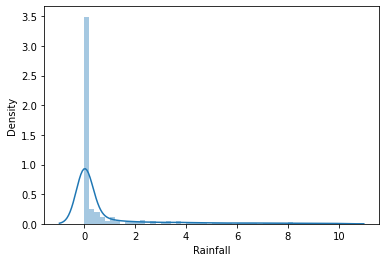

In [61]:
plt.figure(figsize=(6,4))
sns.distplot(data_new.Rainfall)
plt.show()

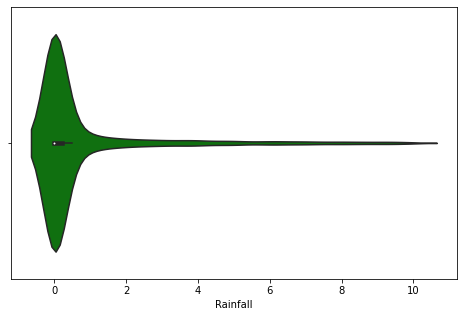

In [62]:
plt.figure(figsize=(8,5))
sns.violinplot(data_new.Rainfall, color='green')
plt.show()

In [63]:
# Observations:

# For maximum case, Rainfall is 0. Let's explore it further.

In [64]:
rain0 = data_new.loc[data_new.Rainfall == 0].shape
rain0

(4299, 25)

In [65]:
# percentage of Rainfall =0:
print ("Percentage of Rainfall eual to 0 mm is:", rain0[0]/data_new.shape[0]*100,"%")

Percentage of Rainfall eual to 0 mm is: 69.42829457364341 %


In [66]:
data_new["Rainfall"].groupby(data_new["WindDir9am"]).agg([min, max, sum])

,min,max,sum
WindDir9am,,,
E,0.0,9.6,109.743541
ENE,0.0,7.8,115.715312
ESE,0.0,9.4,106.487083
N,0.0,10.0,1035.786141
NE,0.0,9.8,196.558854
NNE,0.0,10.0,251.315312
NNW,0.0,9.6,146.602395
NW,0.0,9.2,253.245937
S,0.0,9.4,222.617707


In [67]:
data_new["Rainfall"].groupby(data_new["Location"]).agg([min, max, sum])

,min,max,sum
Location,,,
Adelaide,0.0,8.8,144.287083
Albury,0.0,10.0,583.145937
Brisbane,0.0,10.0,358.858854
CoffsHarbour,0.0,10.0,528.771771
Darwin,0.0,8.2,81.400000
Melbourne,0.0,9.6,714.106244
Newcastle,0.0,10.0,654.004790
Penrith,0.0,10.0,360.515312
PerthAirport,0.0,10.0,742.200000


In [68]:
# Observations:

# For 4299 case that is around 70% cases, the rainfall is 0 mm.

# For maximum rainfall value (which is 1035 mm), WindDir9am is North(N).

# For Uluru, the total rainfall is lowest.

# Checking different feature Vs"RainTomorrow" :

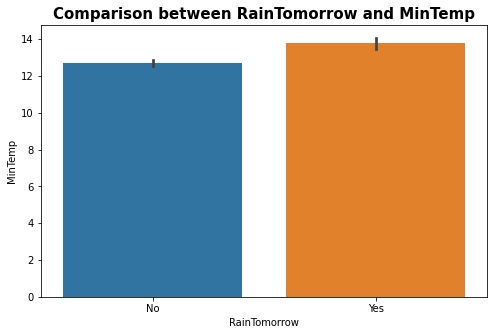

In [69]:
plt.figure(figsize=(8,5))
sns.barplot(x = "RainTomorrow", y = "MinTemp", data = data_new)
plt.title('Comparison between RainTomorrow and MinTemp', fontsize=15, fontweight='bold')
plt.show()

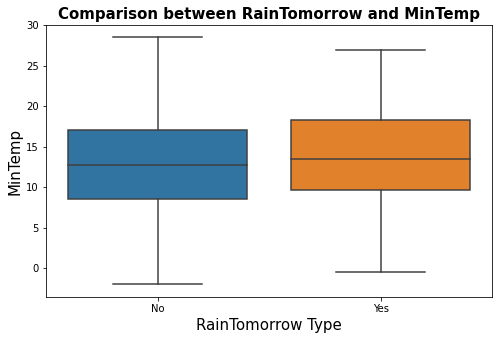

In [70]:
plt.figure(figsize=[8,5])
plt.title('Comparison between RainTomorrow and MinTemp',fontsize=15, fontweight= "bold")
a = sns.boxplot(data_new['RainTomorrow'],data_new["MinTemp"])
a.set_xlabel('RainTomorrow Type',fontsize=15)
a.set_ylabel('MinTemp',fontsize=15)
plt.show()

In [71]:
# Observations:

# There is no specific relation between RainTomorrow and MinTemp.

# Avg temparature for RainTomorrow= Yes, is slightly greater than for the case RainTomorrow= No.

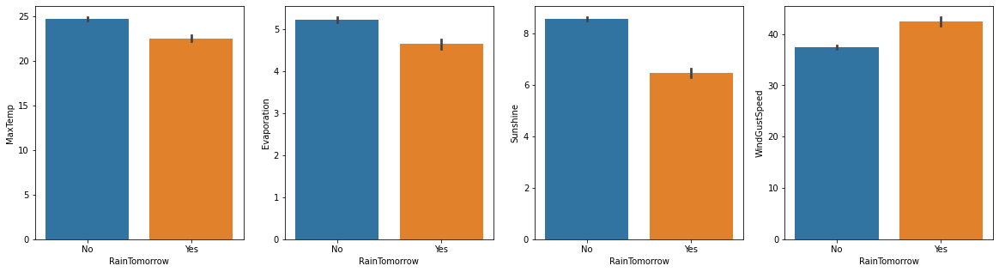

In [72]:
f,ax=plt.subplots(1,4,figsize=(20,5))
sns.barplot(x = "RainTomorrow", y = "MaxTemp", data = data_new, ax=ax[0])
sns.barplot(x = "RainTomorrow", y = "Evaporation",data=data_new, ax=ax[1])
sns.barplot(x = "RainTomorrow", y = "Sunshine", data = data_new, ax=ax[2])
sns.barplot(x = "RainTomorrow", y = "WindGustSpeed",data=data_new, ax=ax[3])
plt.show()


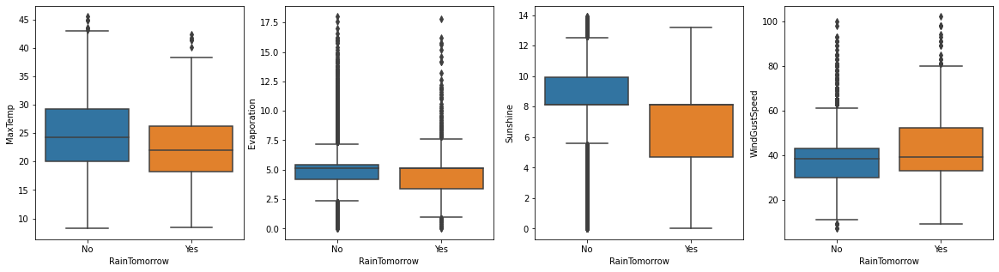

In [73]:
f,ax=plt.subplots(1,4,figsize=(20,5))
sns.boxplot(x = "RainTomorrow", y = "MaxTemp", data = data_new, ax=ax[0])
sns.boxplot(x = "RainTomorrow", y = "Evaporation",data=data_new, ax=ax[1])
sns.boxplot(x = "RainTomorrow", y = "Sunshine", data = data_new, ax=ax[2])
sns.boxplot(x = "RainTomorrow", y = "WindGustSpeed",data=data_new, ax=ax[3])
plt.show()

In [74]:
# Observations:

# The sunshine level is around 6 for RainTomorrow= Yes and it's about 8 for RainTomorrow=No.

# Avg WindGustSpeed is slightly less for RainTomorrow= No than RainTomorrow= Yes.

# For MaxTemp and Evaporation there no such difference between two value of RainTomorrow.

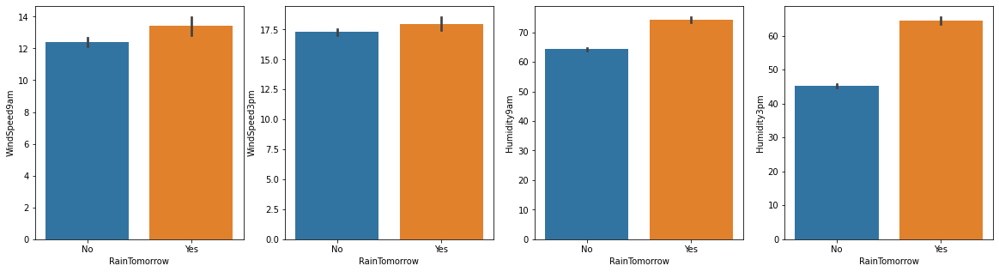

In [75]:
f,ax=plt.subplots(1,4,figsize=(20,5))
sns.barplot(x = "RainTomorrow", y = "WindSpeed9am", data = data_new, ax=ax[0])
sns.barplot(x = "RainTomorrow", y = "WindSpeed3pm",data=data_new, ax=ax[1])
sns.barplot(x = "RainTomorrow", y = "Humidity9am", data = data_new, ax=ax[2])
sns.barplot(x = "RainTomorrow", y = "Humidity3pm",data=data_new, ax=ax[3])
plt.show()

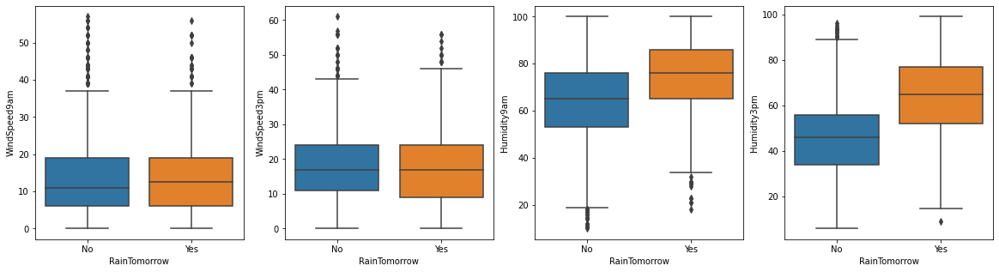

In [76]:
f,ax=plt.subplots(1,4,figsize=(20,5))
sns.boxplot(x = "RainTomorrow", y = "WindSpeed9am", data = data_new, ax=ax[0])
sns.boxplot(x = "RainTomorrow", y = "WindSpeed3pm",data=data_new, ax=ax[1])
sns.boxplot(x = "RainTomorrow", y = "Humidity9am", data = data_new, ax=ax[2])
sns.boxplot(x = "RainTomorrow", y = "Humidity3pm",data=data_new, ax=ax[3])
plt.show()


In [77]:
# Observations:

# If Humidity level is around 40, RainTomorrow is No and if Humidity level is around 60, RainTomorrow is Yes.

# For high Humidity level, the raining tendency is high.

# There is no such relaion between WindSpeed and RainTomorrow.

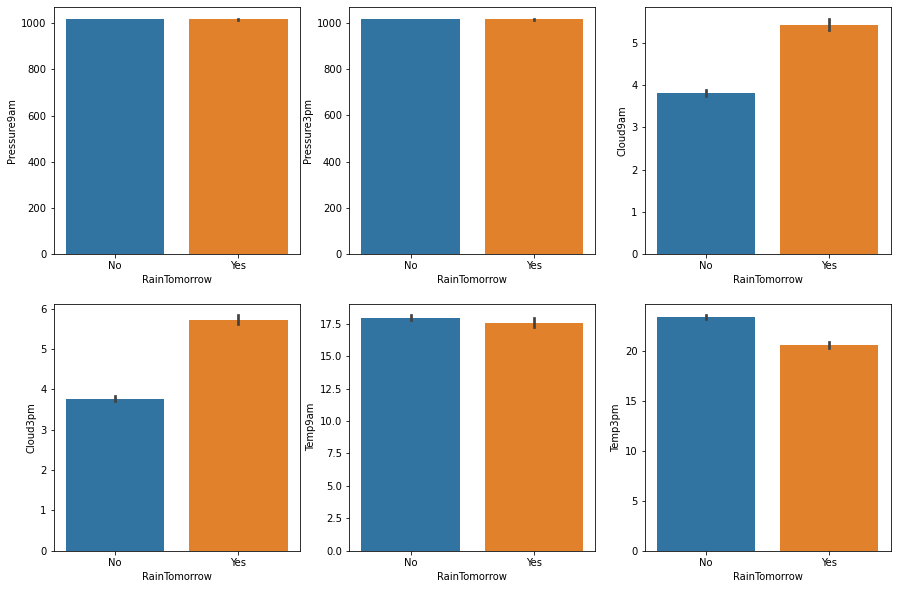

In [78]:
f,ax=plt.subplots(2,3,figsize=(15,10))
sns.barplot(x = "RainTomorrow", y = "Pressure9am", data = data_new, ax=ax[0,0])
sns.barplot(x = "RainTomorrow", y = "Pressure3pm",data=data_new, ax=ax[0,1])
sns.barplot(x = "RainTomorrow", y = "Cloud9am", data = data_new, ax=ax[0,2])
sns.barplot(x = "RainTomorrow", y = "Cloud3pm",data=data_new, ax=ax[1,0])
sns.barplot(x = "RainTomorrow", y = "Temp9am", data = data_new, ax=ax[1,1])
sns.barplot(x = "RainTomorrow", y = "Temp3pm",data=data_new, ax=ax[1,2])
plt.show()

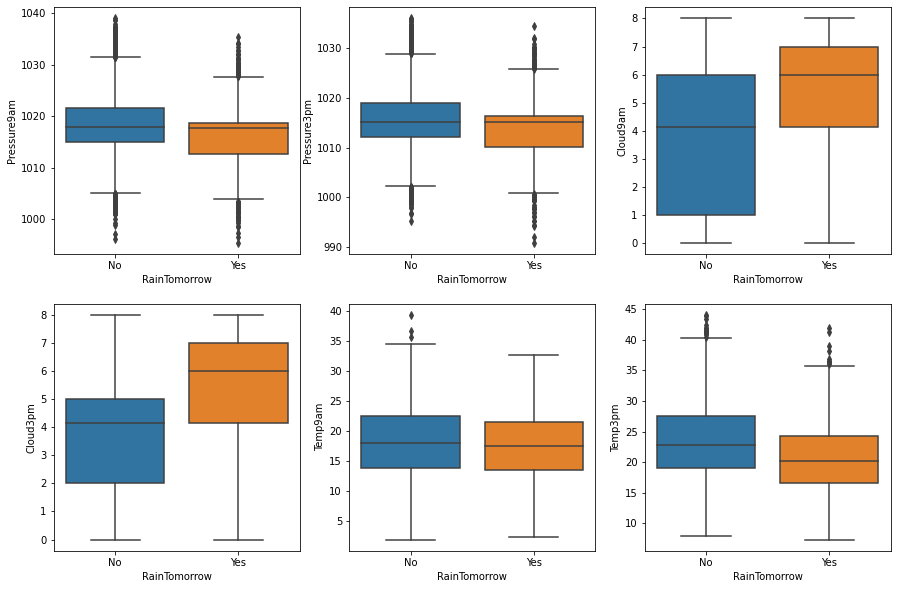

In [79]:
f,ax=plt.subplots(2,3,figsize=(15,10))
sns.boxplot(x = "RainTomorrow", y = "Pressure9am", data = data_new, ax=ax[0,0])
sns.boxplot(x = "RainTomorrow", y = "Pressure3pm",data=data_new, ax=ax[0,1])
sns.boxplot(x = "RainTomorrow", y = "Cloud9am", data = data_new, ax=ax[0,2])
sns.boxplot(x = "RainTomorrow", y = "Cloud3pm",data=data_new, ax=ax[1,0])
sns.boxplot(x = "RainTomorrow", y = "Temp9am", data = data_new, ax=ax[1,1])
sns.boxplot(x = "RainTomorrow", y = "Temp3pm",data=data_new, ax=ax[1,2])
plt.show()


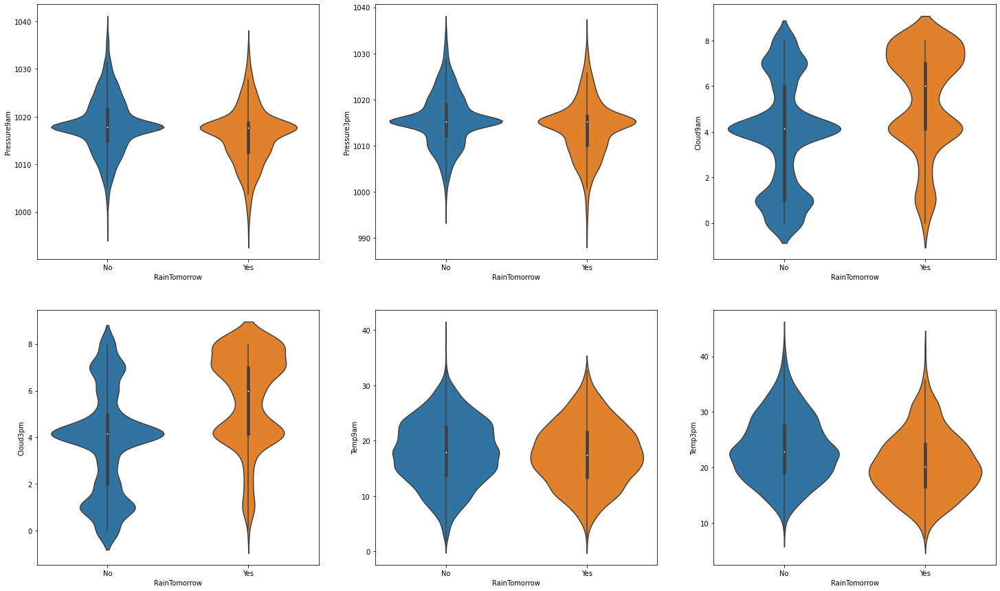

In [80]:
f,ax=plt.subplots(2,3,figsize=(25,15))
sns.violinplot(x = "RainTomorrow", y = "Pressure9am", data = data_new, ax=ax[0,0])
sns.violinplot(x = "RainTomorrow", y = "Pressure3pm",data=data_new, ax=ax[0,1])
sns.violinplot(x = "RainTomorrow", y = "Cloud9am", data = data_new, ax=ax[0,2])
sns.violinplot(x = "RainTomorrow", y = "Cloud3pm",data=data_new, ax=ax[1,0])
sns.violinplot(x = "RainTomorrow", y = "Temp9am", data = data_new, ax=ax[1,1])
sns.violinplot(x = "RainTomorrow", y = "Temp3pm",data=data_new, ax=ax[1,2])

plt.show()

In [81]:
# Observations:

# There is no such relaion between Pressure and RainTomorrow.

# If Fraction of sky obscured by cloud is around 3-4 level, raining probability is No.

# There is also no such relaion between Temparature and RainTomorrow.

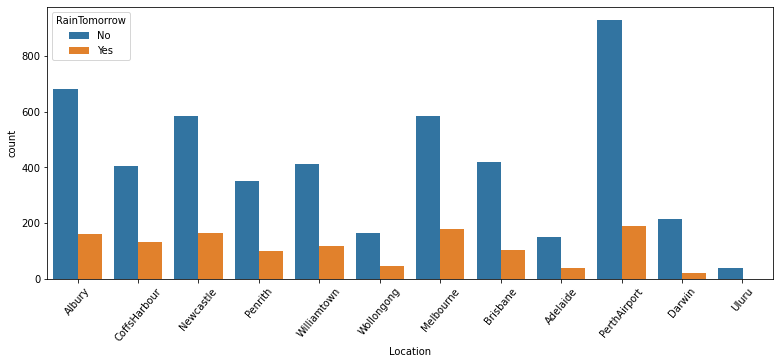

In [82]:
plt.subplots(figsize=(13,5))
sns.countplot(data_new["Location"], hue= data_new["RainTomorrow"])
plt.xticks(rotation=50)
plt.show()


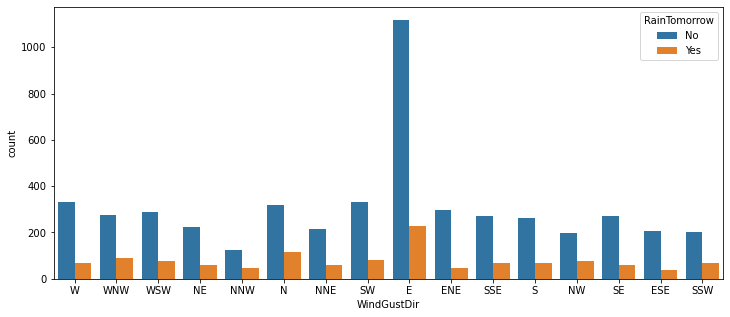

In [83]:
plt.subplots(figsize=(12,5))
sns.countplot(data_new["WindGustDir"], hue= data_new["RainTomorrow"])
plt.xticks(rotation=0)
plt.show()

In [84]:
pd.crosstab(data['RainTomorrow'],data["Location"], margins= True)

Location,Adelaide,Albury,Brisbane,CoffsHarbour,Darwin,Melbourne,Newcastle,Penrith,PerthAirport,Uluru,Williamtown,Wollongong,All
RainTomorrow,,,,,,,,,,,,,
No,160,708,444,425,218,608,624,366,962,39,462,174,5190
Yes,45,199,135,186,32,203,198,116,242,0,153,63,1572
All,205,907,579,611,250,811,822,482,1204,39,615,237,6762


In [85]:
pd.crosstab(data['RainTomorrow'],data["WindGustDir"], margins= True)

WindGustDir,E,ENE,ESE,N,NE,NNE,NNW,NW,S,SE,SSE,SSW,SW,W,WNW,WSW,All
RainTomorrow,,,,,,,,,,,,,,,,,
No,1183,302,212,326,230,218,129,205,278,288,296,218,351,348,290,316,5190
Yes,277,55,55,133,70,69,55,91,98,82,94,81,114,86,108,104,1572
All,1460,357,267,459,300,287,184,296,376,370,390,299,465,434,398,420,6762


In [86]:
# Observations:

# For ParthAirport, the probability of raining tomorrow is high.

# For Uluru, there is no probability of Raining tomorrow.

# Maximium WindGust direction is East(E).

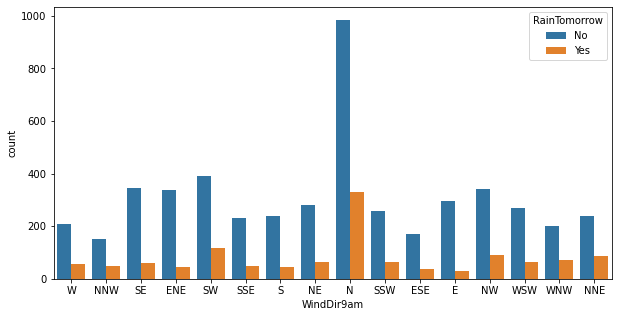

In [87]:
plt.subplots(figsize=(10,5))
sns.countplot(data_new["WindDir9am"], hue= data_new["RainTomorrow"])
plt.xticks(rotation=0)
plt.show()

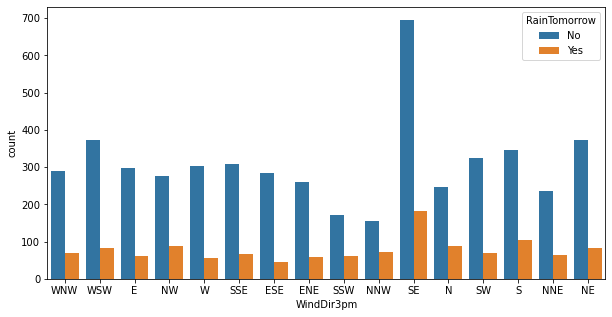

In [88]:
plt.subplots(figsize=(10,5))
sns.countplot(data_new["WindDir3pm"], hue= data_new["RainTomorrow"])
plt.xticks(rotation=0)
plt.show()


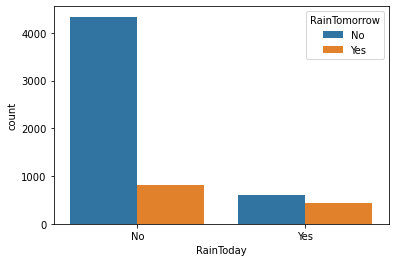

In [89]:
plt.subplots(figsize=(6,4))
sns.countplot(data_new["RainToday"], hue= data_new["RainTomorrow"])
plt.xticks(rotation=0)
plt.show()


In [90]:
pd.crosstab(data['RainTomorrow'],data["RainToday"], margins= True)

RainToday,No,Yes,All
RainTomorrow,,,
No,4374,816,5190
Yes,816,756,1572
All,5190,1572,6762


In [91]:
756/1572

0.48091603053435117

In [92]:
# Observations:

# Maximum wind direction at 9am (WindDir9am) is North(N).

# Maximum wind direction at 3pm (WindDir3pm) is South East(SE).

# If RainToday is Yes then there is around 50%.

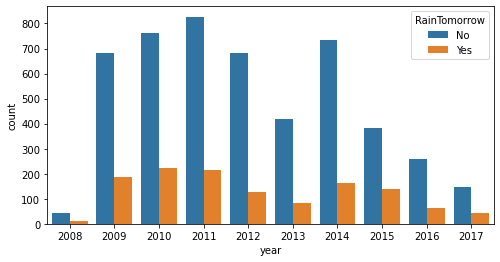

In [93]:
plt.subplots(figsize=(8,4))
sns.countplot(data_new["year"], hue= data_new["RainTomorrow"])
plt.xticks(rotation=0)
plt.show()


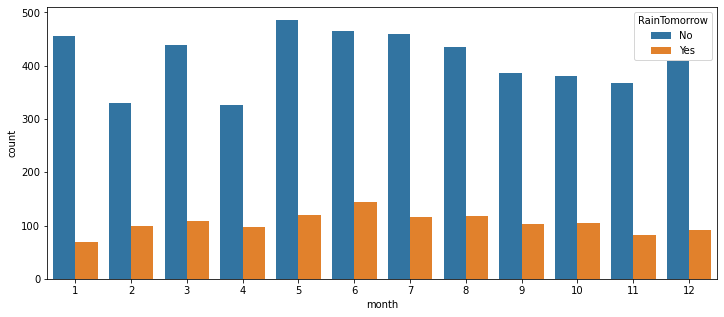

In [94]:
plt.subplots(figsize=(12,5))
sns.countplot(data_new["month"], hue= data_new["RainTomorrow"])
plt.xticks(rotation=0)
plt.show()

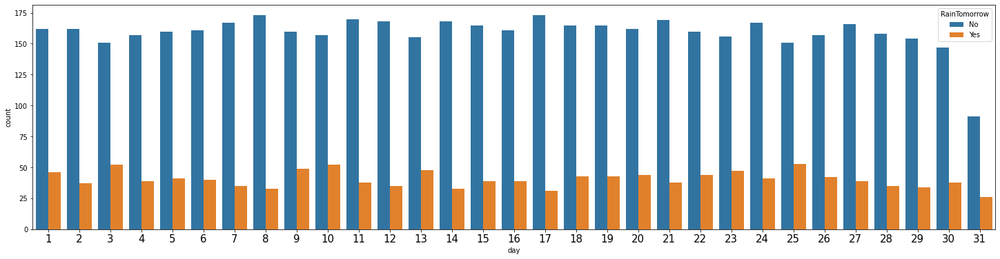

In [95]:
plt.subplots(figsize=(25,6))
sns.countplot(data_new["day"], hue= data_new["RainTomorrow"])
plt.xticks(rotation=0, fontsize=15)
plt.show()


In [96]:
# Observations:

# No such relation is found between days, month and year with RainTomorrow.


# 2) Checking different feature Vs"Rainfall" :

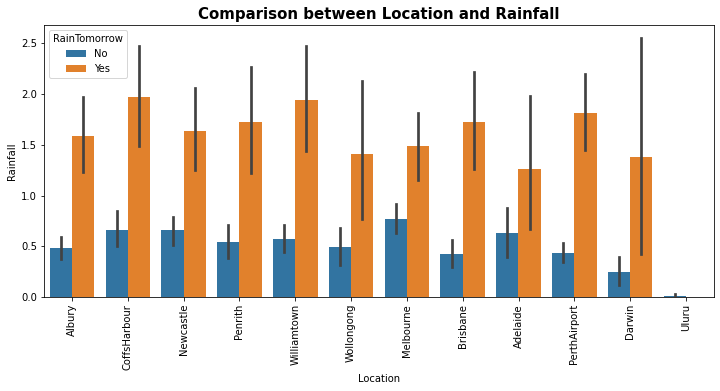

In [97]:
plt.figure(figsize=(12,5))
sns.barplot(x = "Location", y = "Rainfall",hue= 'RainTomorrow' , data = data_new)
plt.title('Comparison between Location and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()


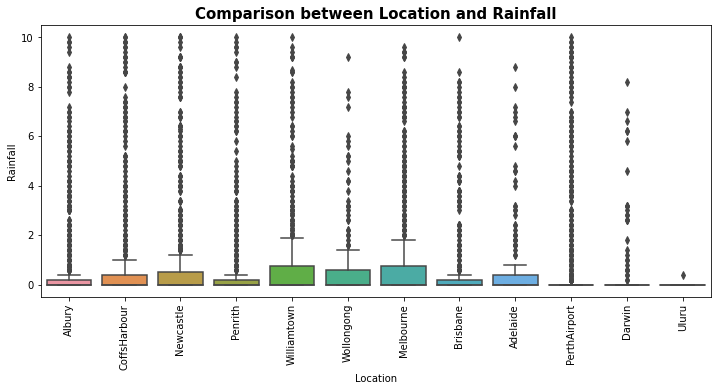

In [98]:
plt.figure(figsize=(12,5))
sns.boxplot(x = "Location", y = "Rainfall", data = data_new)
plt.title('Comparison between Location and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()


In [99]:
# Observations:

# For every case, Rainfall is high if RainTomorrow is Yes.

# The average Rainfall is high for Melbourne and Williamtown.

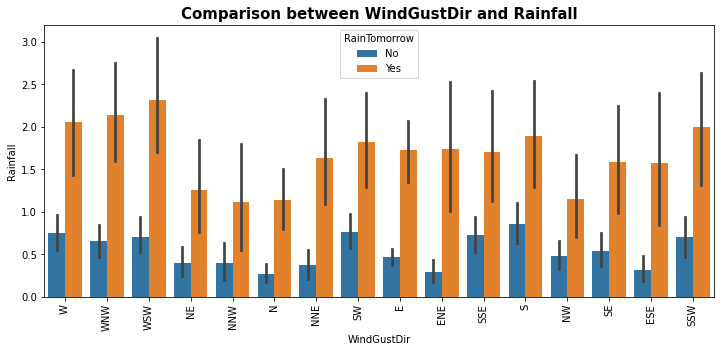

In [100]:
plt.figure(figsize=(12,5))
sns.barplot(x = "WindGustDir", y = "Rainfall", hue= 'RainTomorrow', data = data_new)
plt.title('Comparison between WindGustDir and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

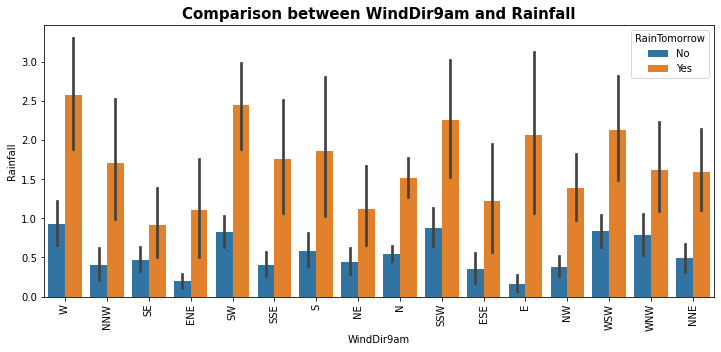

In [101]:
plt.figure(figsize=(12,5))
sns.barplot(x = "WindDir9am", y = "Rainfall",hue= 'RainTomorrow', data = data_new)
plt.title('Comparison between WindDir9am and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()


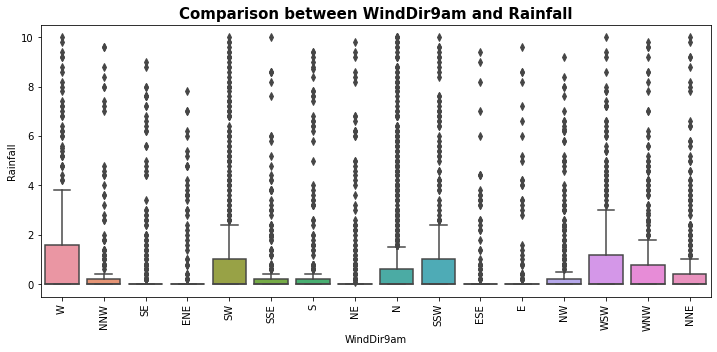

In [102]:
plt.figure(figsize=(12,5))
sns.boxplot(x = "WindDir9am", y = "Rainfall", data = data_new)
plt.title('Comparison between WindDir9am and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()


In [103]:
# Observations:

# For WSW direction of wind gust, rain fall value is maximum(seems by barplot).

# For West direction of wind at 9am, rain fall value is maximum.


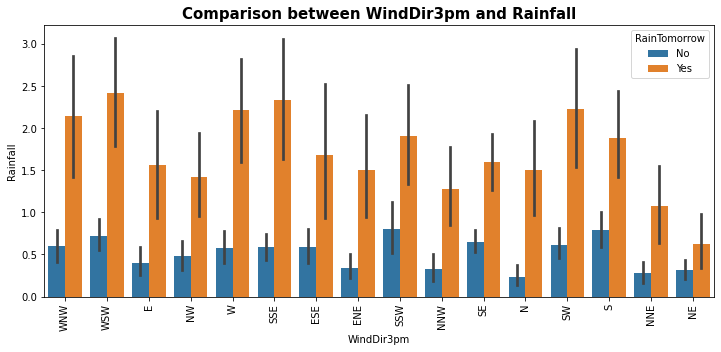

In [104]:
plt.figure(figsize=(12,5))
sns.barplot(x = "WindDir3pm", y = "Rainfall", hue= 'RainTomorrow',data = data_new)
plt.title('Comparison between WindDir3pm and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

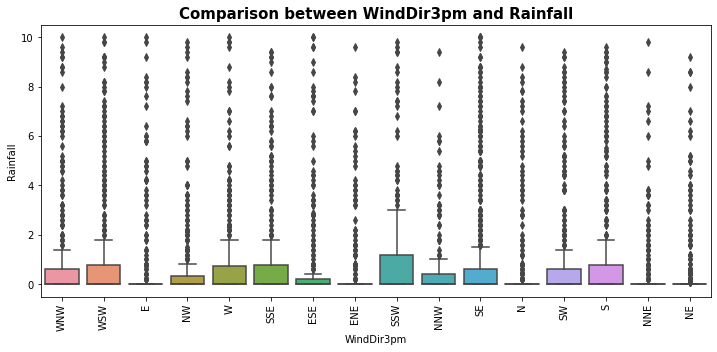

In [105]:
plt.figure(figsize=(12,5))
sns.boxplot(x = "WindDir3pm", y = "Rainfall", data = data_new)
plt.title('Comparison between WindDir3pm and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

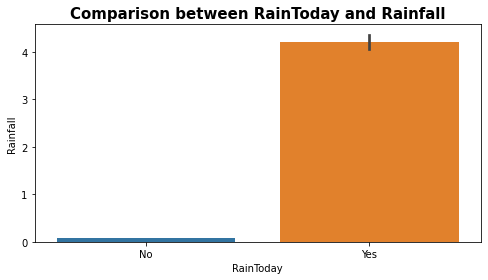

In [106]:
plt.figure(figsize=(8,4))
sns.barplot(x = "RainToday", y = "Rainfall", data = data_new)
plt.title('Comparison between RainToday and Rainfall', fontsize=15, fontweight='bold')
plt.show()

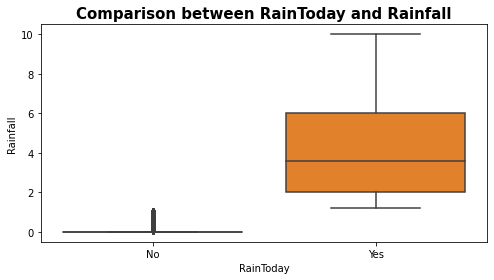

In [107]:
plt.figure(figsize=(8,4))
sns.boxplot(x = "RainToday", y = "Rainfall", data = data_new)
plt.title('Comparison between RainToday and Rainfall', fontsize=15, fontweight='bold')
plt.show()

In [108]:
# Observations:

# If direction of wind gust is WSW and SSE, rain fall value is maximum(seems by barplot).

# Max avg direction of wind gust is SSW.

# If Rainfall is 0, raintoday value is No.

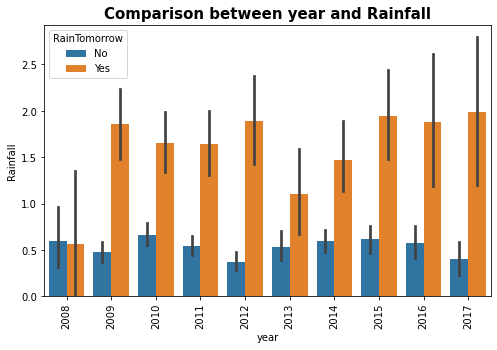

In [109]:
plt.figure(figsize=(8,5))
sns.barplot(x = "year", y = "Rainfall", hue= 'RainTomorrow', data = data_new)
plt.title('Comparison between year and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=90)
plt.show()

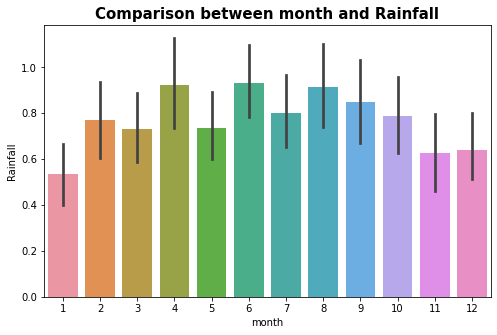

In [110]:
plt.figure(figsize=(8,5))
sns.barplot(x = "month", y = "Rainfall", data = data_new)
plt.title('Comparison between month and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=0)
plt.show()


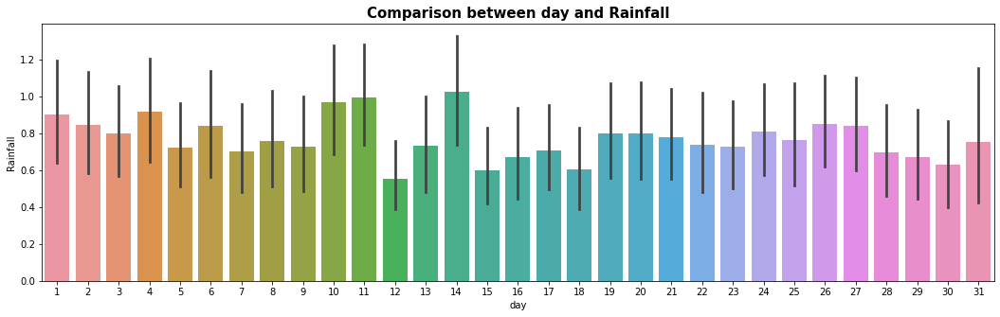

In [111]:
plt.figure(figsize=(18,5))
sns.barplot(x = "day", y = "Rainfall", data = data_new)
plt.title('Comparison between day and Rainfall', fontsize=15, fontweight='bold')
plt.xticks(rotation=0)
plt.show()

In [112]:
# Observation:

# There is no such relation between year, month, days with Rainfall.

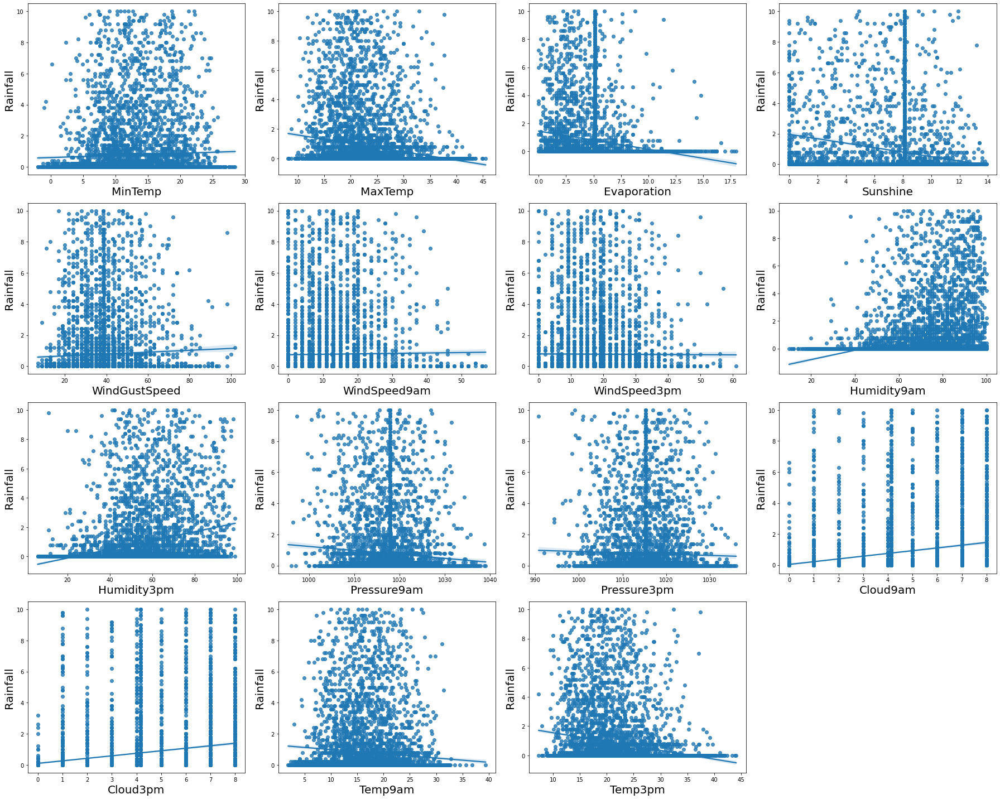

In [113]:
#linear regplot with distribution of numerical features with Rainfall

data_num = data_new[['MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 
                     'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
                     'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']]
i=0
plt.figure(figsize=(25,20))
for p in data_num.columns:
    plt.subplot(4,4,i+1)
    sns.regplot(x= p, y=data_new['Rainfall'], data=data_num)
    plt.xlabel(p,fontsize=20)
    plt.ylabel('Rainfall',fontsize=20)
    i+=1    
plt.tight_layout()

In [114]:
# Observations:

# If humidity increased, Rainfall is also increased.

# There is a linear relationship between cloud and rainfall.

# If temp increased, rainfall is also increased.

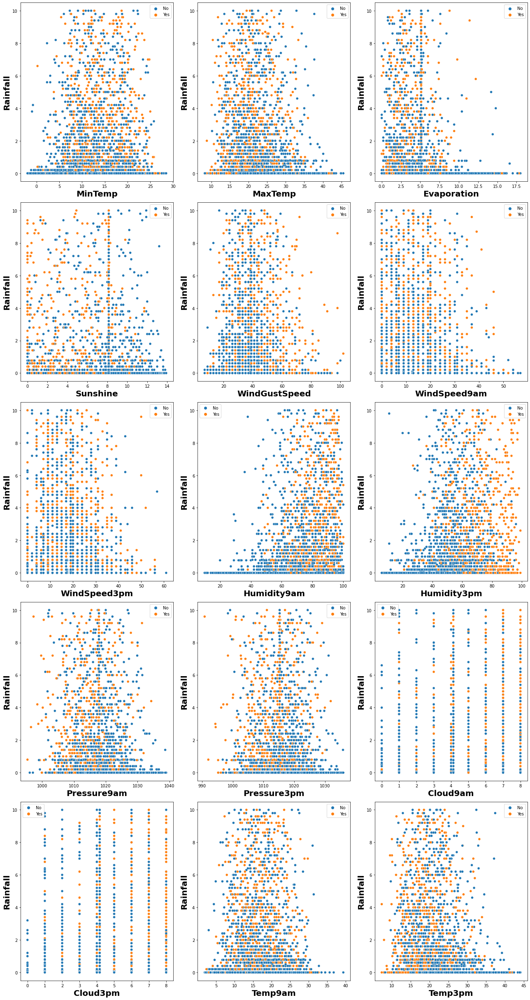

In [115]:
i=0
plt.figure(figsize=(18,40))
for p in data_num.columns:
    plt.subplot(6,3,i+1)
    sns.scatterplot(x=p, y='Rainfall',data= data_new, hue='RainTomorrow' ).legend(loc="best")
    plt.xlabel(p,fontsize=20,fontweight='bold')
    plt.ylabel('Rainfall',fontsize=20, fontweight='bold')
    i+=1   
plt.tight_layout()
plt.show()

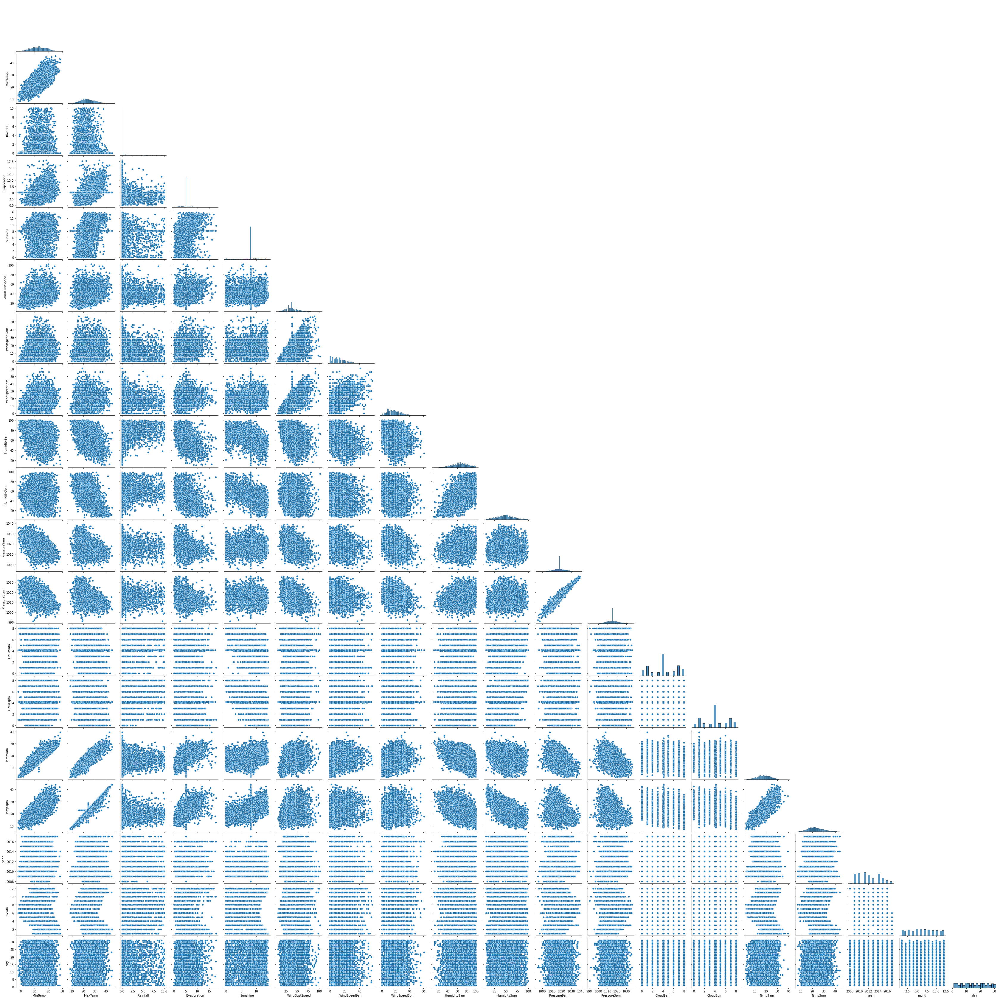

In [116]:
sns.pairplot(data_new, kind='scatter', corner=True)

In [117]:
# Observations:

# If sunshine increased, tendency of rainning tomorrow is also less.

# Clearly, if the fraction of sky obscured by cloud is increased, raining tendency is also increased.

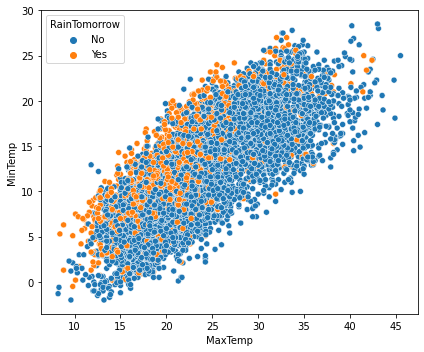

In [118]:
plt.figure(figsize=(6,5))
sns.scatterplot(x='MaxTemp', y='MinTemp',data= data_new, hue='RainTomorrow' )
plt.tight_layout()
plt.show()

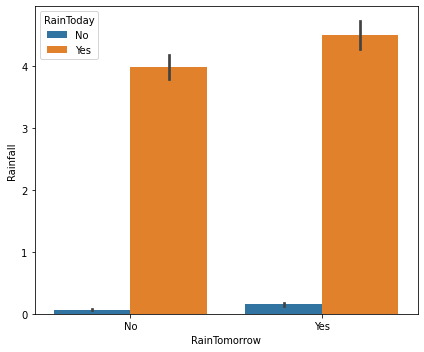

In [119]:
plt.figure(figsize=(6,5))
sns.barplot(y='Rainfall', x='RainTomorrow',data= data_new, hue='RainToday' )
plt.tight_layout()
plt.show()

In [120]:
# Observations:

# The relation between Rainfall and raining tendency of tomorrow (RainTomorrow) is very obvious!!

# It is proved again. If rainfall amount increased, raining tendency of tomorrow is Yes.

<AxesSubplot:xlabel='Sunshine', ylabel='Rainfall'>

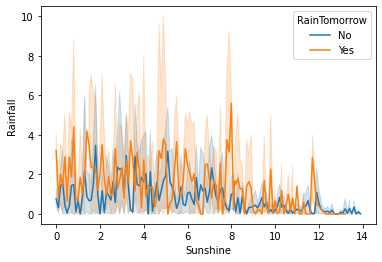

In [121]:
sns.lineplot(data=data_new, x='Sunshine',y='Rainfall',hue= 'RainTomorrow', color='green')

<AxesSubplot:xlabel='Sunshine', ylabel='Evaporation'>

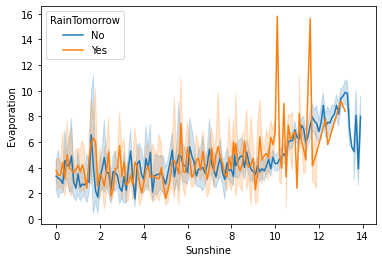

In [122]:
sns.lineplot(data=data_new, x='Sunshine',y='Evaporation', hue= 'RainTomorrow')

In [123]:
# Observations:

# In lineplot it is clearly seen that, if Sunshine increased, Rainfall decresed.

# If shunshine increased, Evaporation rate is also increased.

# Encoding for categorical features:

# Using label encoder:

In [124]:
cat=['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in cat:
    data_new[i] = le.fit_transform(data_new[i])
data_new.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,1,13.4,22.9,0.6,5.11229,8.143039,13,44.0,13,14,...,1007.1,8.000000,4.164883,16.9,21.8,0,0,2008,12,1
1,1,7.4,25.1,0.0,5.11229,8.143039,14,44.0,6,15,...,1007.8,4.130799,4.164883,17.2,24.3,0,0,2008,12,2
2,1,12.9,25.7,0.0,5.11229,8.143039,15,46.0,13,15,...,1008.7,4.130799,2.000000,21.0,23.2,0,0,2008,12,3
3,1,9.2,28.0,0.0,5.11229,8.143039,4,24.0,9,0,...,1012.8,4.130799,4.164883,18.1,26.5,0,0,2008,12,4
4,1,17.5,32.3,1.0,5.11229,8.143039,13,41.0,1,7,...,1006.0,7.000000,8.000000,17.8,29.7,0,0,2008,12,5


In [125]:
# Observations:

# All categorical data are encoded. Now let's check the correlations

# Correlation:

In [126]:
data_new.corr()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
Location,1.000000,0.100250,0.080632,0.002302,0.134742,0.056524,-0.089040,0.267961,-0.098123,-0.003672,...,-0.042807,-0.004300,-0.005083,0.107696,0.075844,-0.008783,-0.002677,0.501011,-0.071946,0.003197
MinTemp,0.100250,1.000000,0.741055,0.040954,0.391403,0.067218,-0.136507,0.263786,-0.019987,-0.132174,...,-0.458063,0.078963,0.030864,0.895394,0.709436,0.034233,0.075754,0.031078,-0.231714,0.020505
MaxTemp,0.080632,0.741055,1.000000,-0.189598,0.486379,0.364127,-0.191997,0.202769,-0.186338,-0.145656,...,-0.437712,-0.238150,-0.234404,0.868868,0.974603,-0.209070,-0.144266,0.079724,-0.173423,0.023737
Rainfall,0.002302,0.040954,-0.189598,1.000000,-0.159763,-0.208545,0.088653,0.042296,0.110365,0.082081,...,-0.026461,0.233549,0.200451,-0.085329,-0.194727,0.827864,0.247938,0.003657,0.005039,-0.017296
Evaporation,0.134742,0.391403,0.486379,-0.159763,1.000000,0.397755,-0.117932,0.243467,-0.127260,-0.019036,...,-0.314186,-0.130773,-0.166741,0.451956,0.472986,-0.170650,-0.102079,0.103643,-0.058832,0.013186
Sunshine,0.056524,0.067218,0.364127,-0.208545,0.397755,1.000000,-0.100710,0.033304,-0.077125,-0.055081,...,-0.077330,-0.528334,-0.553935,0.251112,0.383414,-0.211077,-0.318230,0.065206,-0.011679,0.002237
WindGustDir,-0.089040,-0.136507,-0.191997,0.088653,-0.117932,-0.100710,1.000000,-0.003280,0.368439,0.452680,...,-0.018671,0.117967,0.077582,-0.146291,-0.205601,0.101542,0.035998,-0.178586,0.028462,0.017704
WindGustSpeed,0.267961,0.263786,0.202769,0.042296,0.243467,0.033304,-0.003280,1.000000,-0.094370,0.057896,...,-0.361747,-0.012150,0.038674,0.252055,0.168776,0.043136,0.154622,-0.029067,0.048590,-0.005349
WindDir9am,-0.098123,-0.019987,-0.186338,0.110365,-0.127260,-0.077125,0.368439,-0.094370,1.000000,0.207692,...,0.051931,0.065252,0.054286,-0.060992,-0.195264,0.124943,0.023073,-0.064721,0.017523,-0.012212
WindDir3pm,-0.003672,-0.132174,-0.145656,0.082081,-0.019036,-0.055081,0.452680,0.057896,0.207692,1.000000,...,-0.044813,0.066902,0.051211,-0.131194,-0.159828,0.083994,-0.006565,0.011863,0.025747,0.004704


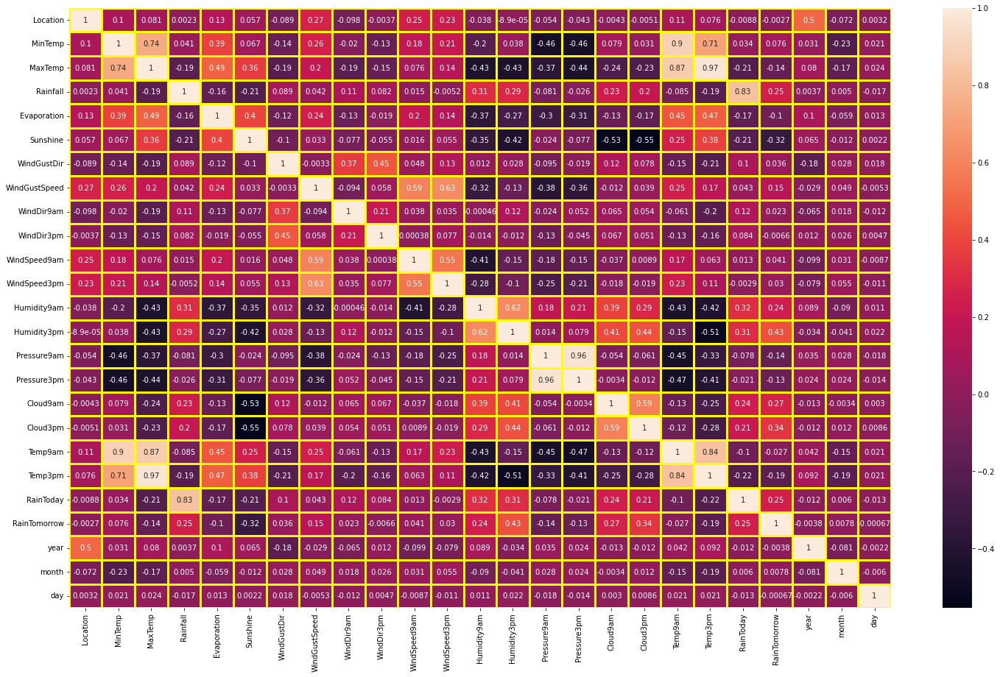

In [127]:
plt.subplots(figsize=(25,15))
sns.heatmap(data_new.corr(), annot= True, linecolor= "yellow",  linewidths= 3)
plt.show()

In [128]:
data_new.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'year', 'month', 'day'],
      dtype='object')

In [129]:
# Observations:

#  Humidity3pm is highly correlated with RainTomorrow.

# Different temparature data (MinTemp,MaxTemp,Temp9am, Temp3pm) are highly correlated with each others.

# Different wind direction (WindDir9am, WindDir3pm) are highly correlated with each others.

# Different wind speed (WindGustSpeed, WindSpeed9am , WindSpeed3pm) are highly correlated with each others.

# Day, month, year are not correlated with any other features.

In [130]:
data_new1= data_new.copy()
data_new2= data_new.copy()


# Correlation with Other features with RainTomorrow (label_1):

<AxesSubplot:title={'center':'feature vs RainTomorrow corr'}>

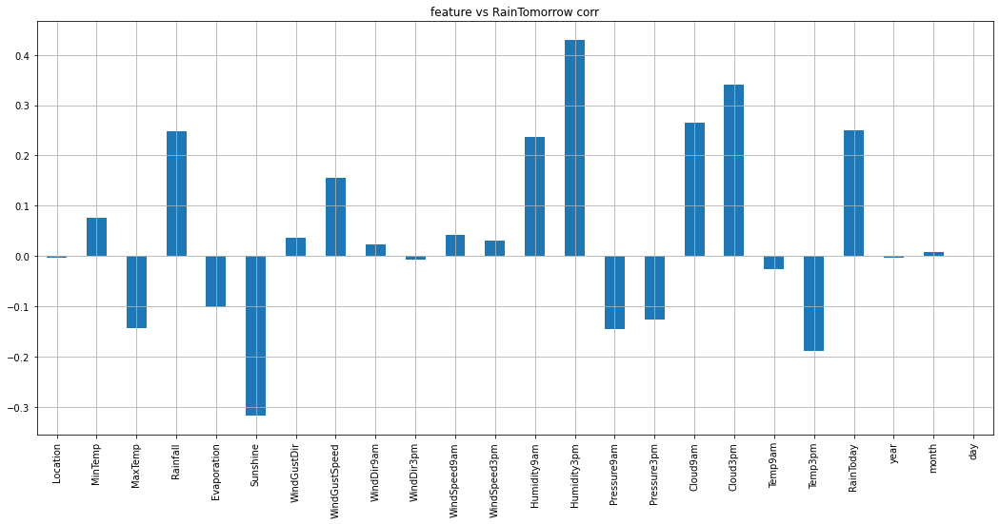

In [133]:
data_new1.drop("RainTomorrow", axis=1).corrwith(data_new1["RainTomorrow"]).plot(kind='bar',figsize=(18,8),grid='True',title='feature vs RainTomorrow corr')


In [134]:
# Observations:

# RainTomorrow has high possitive correlation with humidity, sunshine and cloud.

# RainTomorrow is lessly correlated with day, month, year, location and wind direction.

# Correlation with Other features with Rainfall (label_2):

<AxesSubplot:title={'center':'feature vs Rainfall corr'}>

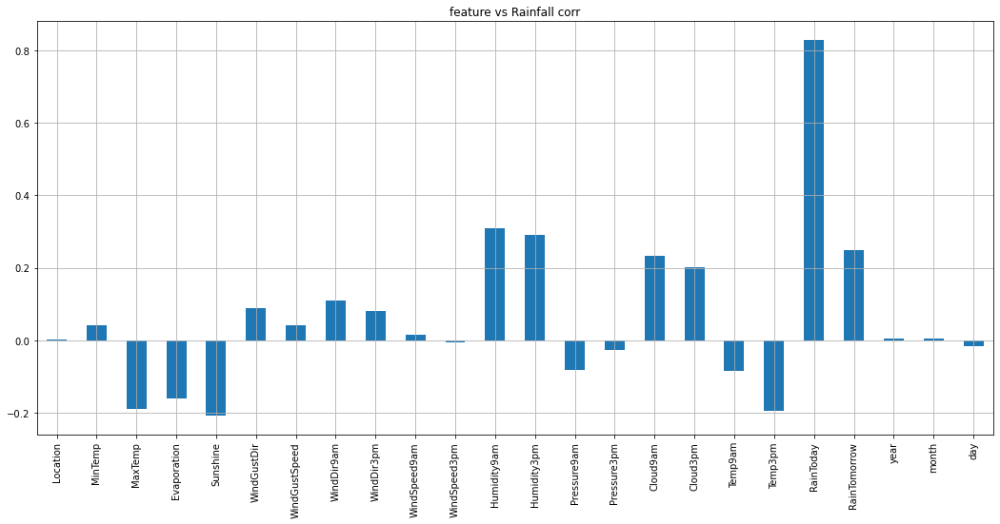

In [135]:
data_new2.drop("Rainfall", axis=1).corrwith(data_new2["Rainfall"]).plot(kind='bar',figsize=(18,8),grid='True',title='feature vs Rainfall corr')


In [136]:
# Observations:

# Rainfall is high positive correlated with raintoday.

# Rainfall is lessly correlated with day, month, year, location and wind direction.

# Sunshine is negetively related with Rainfall.

# Skewness:

In [137]:
data_new.skew().sort_values()

Sunshine        -1.012057
Humidity9am     -0.223152
WindDir3pm      -0.096680
Cloud9am        -0.093878
Cloud3pm        -0.071504
Temp9am         -0.050254
MinTemp         -0.046847
Location        -0.006366
day              0.006650
month            0.011038
Pressure9am      0.081769
Pressure3pm      0.096755
WindGustDir      0.132835
Humidity3pm      0.154749
WindDir9am       0.262312
MaxTemp          0.305323
Temp3pm          0.330136
year             0.353322
WindSpeed3pm     0.507849
WindGustSpeed    0.776532
WindSpeed9am     0.961407
Evaporation      1.067808
RainTomorrow     1.480814
RainToday        1.775317
Rainfall         2.950935
dtype: float64

In [138]:
# Observations:

# Here let's take the skewness range is -0.5 to +0.5. Any data with skewness value above this range are skewed.

# 'WindDir3pm','RainTomorrow', 'RainToday' are categorical data with skewness. Let's keep those.

# Some numerical features have skewness. Let's remove it.

In [139]:
df= data_new.copy()

In [140]:
df[['Sunshine', 'Humidity9am',  'Cloud9am','Cloud3pm', 'WindGustSpeed', 
                     'WindSpeed9am', 'Evaporation', 'Rainfall']]

,Sunshine,Humidity9am,Cloud9am,Cloud3pm,WindGustSpeed,WindSpeed9am,Evaporation,Rainfall
0,8.143039,71.0,8.000000,4.164883,44.000000,20.0,5.11229,0.6
1,8.143039,44.0,4.130799,4.164883,44.000000,4.0,5.11229,0.0
2,8.143039,38.0,4.130799,2.000000,46.000000,19.0,5.11229,0.0
3,8.143039,45.0,4.130799,4.164883,24.000000,11.0,5.11229,0.0
4,8.143039,82.0,7.000000,8.000000,41.000000,7.0,5.11229,1.0
...,...,...,...,...,...,...,...,...
8420,8.143039,51.0,4.130799,4.164883,31.000000,13.0,5.11229,0.0
8421,8.143039,56.0,4.130799,4.164883,22.000000,13.0,5.11229,0.0
8422,8.143039,53.0,4.130799,4.164883,37.000000,9.0,5.11229,0.0
8423,8.143039,51.0,3.000000,2.000000,28.000000,13.0,5.11229,0.0


In [141]:
df[['Sunshine', 'Humidity9am',  'Cloud9am','Cloud3pm', 'WindGustSpeed', 
                     'WindSpeed9am', 'Evaporation', 'Rainfall']].skew().sort_values()

Sunshine        -1.012057
Humidity9am     -0.223152
Cloud9am        -0.093878
Cloud3pm        -0.071504
WindGustSpeed    0.776532
WindSpeed9am     0.961407
Evaporation      1.067808
Rainfall         2.950935
dtype: float64

In [142]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method = 'yeo-johnson')
df[['Sunshine', 'Humidity9am',  'Cloud9am','Cloud3pm', 'WindGustSpeed','WindSpeed9am',
    'Evaporation', 'Rainfall']] = scaler.fit_transform(df[['Sunshine', 'Humidity9am',  'Cloud9am','Cloud3pm', 
                                'WindGustSpeed','WindSpeed9am', 'Evaporation', 'Rainfall']].values)
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,year,month,day
0,1,13.4,22.9,1.219177,0.096855,-0.111695,13,0.510244,13,14,...,1007.1,1.514840,0.030542,16.9,21.8,0,0,2008,12,1
1,1,7.4,25.1,-0.626148,0.096855,-0.111695,14,0.510244,6,15,...,1007.8,0.039812,0.030542,17.2,24.3,0,0,2008,12,2
2,1,12.9,25.7,-0.626148,0.096855,-0.111695,15,0.648740,13,15,...,1008.7,0.039812,-0.921266,21.0,23.2,0,0,2008,12,3
3,1,9.2,28.0,-0.626148,0.096855,-0.111695,4,-1.162822,9,0,...,1012.8,0.039812,0.030542,18.1,26.5,0,0,2008,12,4
4,1,17.5,32.3,1.550603,0.096855,-0.111695,13,0.294932,1,7,...,1006.0,1.144654,1.606329,17.8,29.7,0,0,2008,12,5


In [143]:
df[['Sunshine', 'Humidity9am',  'Cloud9am','Cloud3pm', 'WindGustSpeed', 
                     'WindSpeed9am', 'Evaporation', 'Rainfall']].skew().sort_values()

Cloud9am        -0.213344
Cloud3pm        -0.175761
WindSpeed9am    -0.098294
Sunshine        -0.064093
Humidity9am     -0.059144
WindGustSpeed    0.014721
Evaporation      0.075057
Rainfall         1.115580
dtype: float64

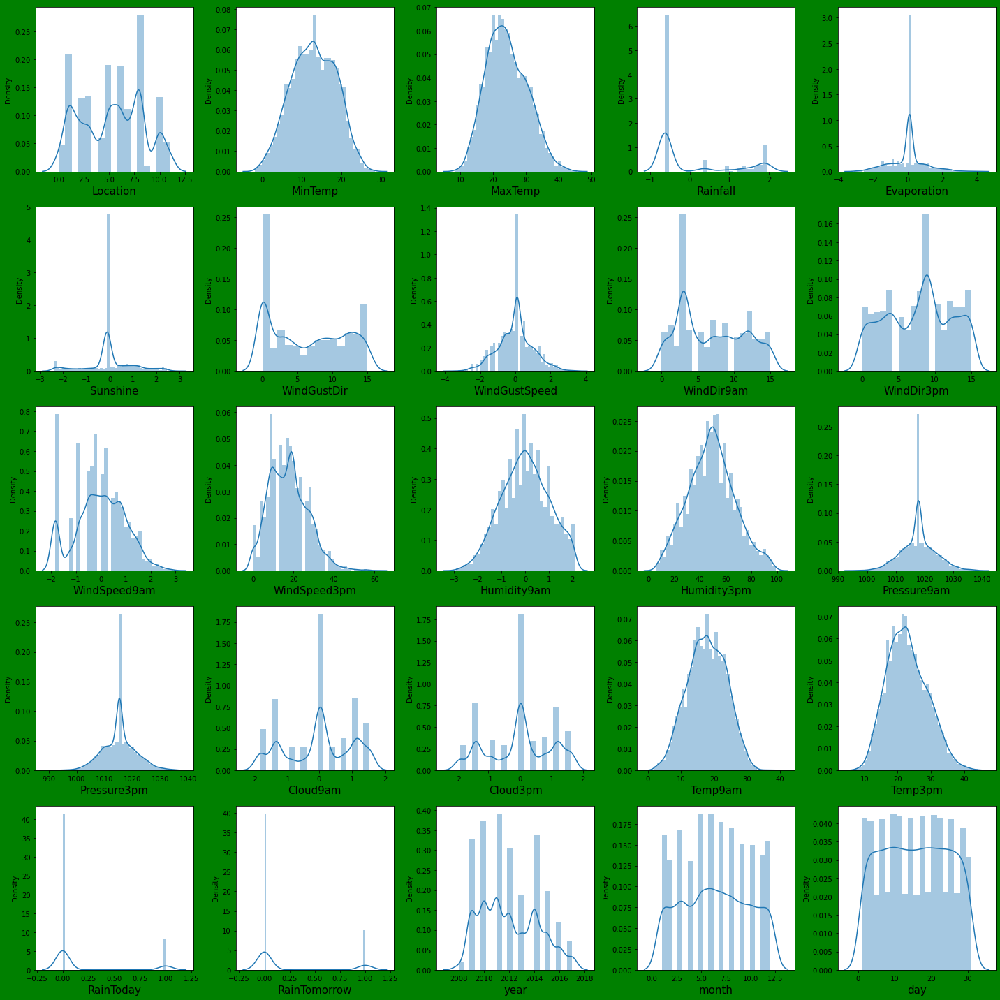

In [144]:
plt.figure(figsize=(20,20),facecolor='green')
plno=1
for x in df:
    if plno<=25:
        plt.subplot(5,5,plno)
        sns.distplot(df[x])
        plt.xlabel (x, fontsize=15)
    plno +=1
plt.tight_layout()

In [145]:
# Observations:

# Overall skewness is removed.

# Checking Multicollinearity:

In [146]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif= pd.DataFrame()
vif["VIF"]= [variance_inflation_factor(df.values,i)for i in range(df.shape[1])]
vif["Features"] = df.columns
vif


,VIF,Features
0,4.662270,Location
1,57.575868,MinTemp
2,435.269739,MaxTemp
3,3.866353,Rainfall
4,1.675385,Evaporation
5,2.176406,Sunshine
6,3.898123,WindGustDir
7,2.351482,WindGustSpeed
8,4.367772,WindDir9am
9,5.683163,WindDir3pm


In [147]:
# Observation:

# Multicollinearity present between different features.

# will decide to remove after checking PCA.

# Principal Component Analysis (PCA) for RainTomorrow (target1):

In [148]:
# Splitting data in target and features
x = df.drop(['RainTomorrow'], axis =1)
y = df['RainTomorrow']


In [149]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
pca = PCA()
scaler= StandardScaler()
x_scale = scaler.fit_transform(x)

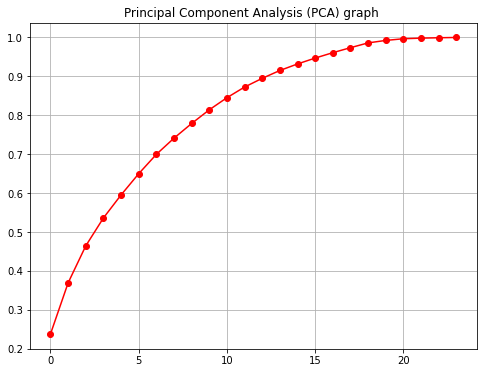

In [150]:
x_pca = pca.fit_transform(x_scale)
plt.figure(figsize=(8,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), 'ro-')
plt.title('Principal Component Analysis (PCA) graph ')
plt.grid()

In [151]:
# Observations:

# Here , around 100% variance gives the first 18 component. Let's take the first 18 components.

In [152]:
pca_new = PCA(n_components=18)
x_scale_new = pca_new.fit_transform(x_scale)
prin_x=pd.DataFrame(x_scale_new )
prin_x.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0.185696,2.058799,2.426091,-2.708043,-0.461850,0.226057,1.021020,-1.841043,0.906646,-0.176541,0.094152,-0.183305,0.607527,0.916737,1.275850,0.431561,-0.429944,-0.386843
1,0.776731,-0.073495,2.282371,-2.836269,-0.842932,-0.287382,1.905560,-1.721462,0.761154,-1.202865,-0.152154,0.466654,0.140669,0.250698,-0.197721,0.477076,0.407630,0.336084
2,1.672951,0.703057,3.315812,-3.061692,-0.587741,-0.077803,0.637753,-1.558628,0.672526,0.232163,-0.329854,0.427214,-0.107856,0.165339,0.737287,-0.191708,0.245054,0.191041
3,0.777712,-1.760886,0.055044,-1.878178,-1.823957,1.521855,0.583233,-1.517376,1.512926,0.520254,-0.866700,-1.309650,0.926117,-0.156615,0.281405,0.491985,0.068742,0.366839
4,0.885993,2.116557,-0.469062,-2.113850,-1.447582,0.889301,1.562778,-1.311374,1.186891,-1.562061,0.201854,0.739861,1.673946,0.269606,-0.551174,0.613048,-0.371297,-0.623882


# Final predictions using different Classification ML Models for RainTomorrow (target1):

# Balancing Imbalanced target feature(RainTomorrow) using SMOTE:

In [153]:
from imblearn.over_sampling import SMOTE
ovrs = SMOTE()

In [154]:
y.value_counts()

0    4938
1    1254
Name: RainTomorrow, dtype: int64

In [155]:
x_scale_new,y = ovrs.fit_resample(x_scale_new,y)
y.value_counts()

0    4938
1    4938
Name: RainTomorrow, dtype: int64

# Find best Random state:

In [156]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report,f1_score

from sklearn.linear_model import LogisticRegression

acc_max=0
random_max=0
for i in range(0, 500):
    x_train,x_test,y_train,y_test = train_test_split(x_scale_new,y,test_size = 0.25, random_state=i)
    log= LogisticRegression()
    log.fit(x_train,y_train)
    y_pred=log.predict(x_test)
    acc= accuracy_score(y_test,y_pred)
    if acc>acc_max:
        acc_max=acc
        random_max=i
        
print('Best accuracy is', acc_max ,'on Random_state', random_max)

Best accuracy is 0.7906034831915756 on Random_state 388


In [157]:
# Here the best accuracy on Random_state=388, Let's take it.

In [158]:
print('Training feature shape:',x_train.shape)
print('Training target shape:',y_train.shape)
print('Test feature shape:',x_test.shape)
print('Test target shape:',y_test.shape)

Training feature shape: (7407, 18)
Training target shape: (7407,)
Test feature shape: (2469, 18)
Test target shape: (2469,)


# Using LogisticRegression():

In [163]:
from sklearn.linear_model import LogisticRegression

x_train,x_test,y_train,y_test = train_test_split(x_scale_new,y,test_size = 0.25, random_state=483)

log = LogisticRegression()

log.fit(x_train, y_train)

y_pred = log.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print ('cof_mat:\n ', confusion_matrix(y_test, y_pred))
print('classification report:\n ', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', log.score(x_train, y_train))
print('testing score : ', log.score(x_test, y_test))

accu score :  0.7869582827055488
cof_mat:
  [[992 252]
 [274 951]]
classification report:
                precision    recall  f1-score   support

           0       0.78      0.80      0.79      1244
           1       0.79      0.78      0.78      1225

    accuracy                           0.79      2469
   macro avg       0.79      0.79      0.79      2469
weighted avg       0.79      0.79      0.79      2469

-----------
-----------
training score :  0.7667071688942891
testing score :  0.7869582827055488


# Use GridSearchCV for hyperparameter tuning:

In [167]:
from sklearn.model_selection import GridSearchCV
grid = dict(solver=['newton-cg', 'lbfgs', 'liblinear', 'sag'],penalty=['l2','l1','elasticnet', 'none'], C=[1.0, 0.1,0.01,0.001]
           , max_iter=[100, 140, 80])

grid_log = GridSearchCV(estimator=log, param_grid= grid, cv=5 )

grid_log.fit(x_train, y_train)
print('best params : ', grid_log.best_params_)

best params :  {'C': 1.0, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'}


In [168]:
grid_log_best = grid_log.best_estimator_
grid_log_best.fit(x_train, y_train)

y_pred = grid_log_best.predict(x_test)


print('accu score : ', accuracy_score(y_test, y_pred))
print ('cof_mat:\n\n ', confusion_matrix(y_test, y_pred))
print('classification report:\n ', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', grid_log_best.score(x_train, y_train))
print('testing score : ', grid_log_best.score(x_test, y_test))

accu score :  0.7869582827055488
cof_mat:

  [[992 252]
 [274 951]]
classification report:
                precision    recall  f1-score   support

           0       0.78      0.80      0.79      1244
           1       0.79      0.78      0.78      1225

    accuracy                           0.79      2469
   macro avg       0.79      0.79      0.79      2469
weighted avg       0.79      0.79      0.79      2469

-----------
-----------
training score :  0.7667071688942891
testing score :  0.7869582827055488


In [169]:
# Observations:

# scores have not improved

# Using DecisionTreeClassifier()

In [170]:
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier()
clf.fit(x_train, y_train)

y_pred = clf.predict(x_test)


print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n\n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', clf.score(x_train, y_train))
print('testing score : ', clf.score(x_test, y_test))

accu score :  0.8153098420413123


cof_mat:  [[ 975  269]
 [ 187 1038]]


classification report: 

               precision    recall  f1-score   support

           0       0.84      0.78      0.81      1244
           1       0.79      0.85      0.82      1225

    accuracy                           0.82      2469
   macro avg       0.82      0.82      0.82      2469
weighted avg       0.82      0.82      0.82      2469

-----------
-----------
training score :  1.0
testing score :  0.8153098420413123


# Use GridSearchCV for hyperparameter tuning:


In [171]:
param = {'criterion' : ['gini', 'entropy', 'log_loss'],
    'min_samples_split' : range(1,4), 'splitter': ["best", "random"], 'ccp_alpha': [0.1, .01, .001, 10,1],
        'max_features': ['auto', 'sqrt', 'log2']}

grid_search = GridSearchCV(estimator = clf, cv=5, param_grid = param)

grid_search.fit(x_train, y_train)
print('best params : ', grid_search.best_params_)

best params :  {'ccp_alpha': 0.001, 'criterion': 'entropy', 'max_features': 'sqrt', 'min_samples_split': 3, 'splitter': 'best'}


In [172]:
grid_clf_best = grid_search.best_estimator_
grid_clf_best.fit(x_train, y_train)

y_pred = grid_clf_best.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n\n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")


print('training score : ', grid_clf_best.score(x_train, y_train))
print('testing score : ', grid_clf_best.score(x_test, y_test))

accu score :  0.7946537059538274


cof_mat:  [[ 940  304]
 [ 203 1022]]


classification report: 

               precision    recall  f1-score   support

           0       0.82      0.76      0.79      1244
           1       0.77      0.83      0.80      1225

    accuracy                           0.79      2469
   macro avg       0.80      0.79      0.79      2469
weighted avg       0.80      0.79      0.79      2469

-----------
-----------
training score :  0.8672877008235453
testing score :  0.7946537059538274


In [173]:
# Observations:

# Accuracy score is not improved after using GridSearchCV with DecisionTreeClassifier().

# But the difference between training score, testing score is decreased.

# Using GradientBoostingClassifier():

In [174]:
from sklearn.ensemble import GradientBoostingClassifier

gbdt= GradientBoostingClassifier()
gbdt.fit(x_train, y_train)

y_pred = gbdt.predict(x_test)


print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n\n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', gbdt.score(x_train, y_train))
print('testing score : ', gbdt.score(x_test, y_test))

accu score :  0.8234102875658161


cof_mat:  [[1019  225]
 [ 211 1014]]


classification report: 

               precision    recall  f1-score   support

           0       0.83      0.82      0.82      1244
           1       0.82      0.83      0.82      1225

    accuracy                           0.82      2469
   macro avg       0.82      0.82      0.82      2469
weighted avg       0.82      0.82      0.82      2469

-----------
-----------
training score :  0.8451464830565681
testing score :  0.8234102875658161


# Using Gridsearch CV:

In [175]:
param= {"min_samples_split" : [2,3],"learning_rate": [0.1,0.01,1.0], 
        "min_samples_leaf" :[1,2], "criterion":['friedman_mse', 'squared_error'] }

grid_gbdt= GridSearchCV (gbdt, param_grid= param,cv=5)

grid_gbdt.fit(x_train, y_train)
print('best params : ', grid_gbdt.best_params_)

best params :  {'criterion': 'squared_error', 'learning_rate': 1.0, 'min_samples_leaf': 1, 'min_samples_split': 3}


In [176]:
grid_gbdt_best = grid_gbdt.best_estimator_
grid_gbdt_best.fit(x_train, y_train)

y_pred = grid_gbdt_best.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report:\n\n ', classification_report(y_test, y_pred))

print("-----------")
print("-----------")


print('training score : ', grid_gbdt_best.score(x_train, y_train))
print('testing score : ', grid_gbdt_best.score(x_test, y_test))

accu score :  0.8319157553665452


cof_mat:  [[1015  229]
 [ 186 1039]]


classification report:

                precision    recall  f1-score   support

           0       0.85      0.82      0.83      1244
           1       0.82      0.85      0.83      1225

    accuracy                           0.83      2469
   macro avg       0.83      0.83      0.83      2469
weighted avg       0.83      0.83      0.83      2469

-----------
-----------
training score :  0.9617928986094235
testing score :  0.8319157553665452


In [177]:
# Observations:

# Accuracy score, training score, testing score are slightly improved after using GridSearchCV with GradientBoostingClassifier()

# Using RandomForestClassifier()

In [178]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(x_train, y_train)

y_pred = rf.predict(x_test)


print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: ', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', rf.score(x_train, y_train))
print('testing score : ', rf.score(x_test, y_test))

accu score :  0.9056298096395302


cof_mat:  [[1098  146]
 [  87 1138]]


classification report:                precision    recall  f1-score   support

           0       0.93      0.88      0.90      1244
           1       0.89      0.93      0.91      1225

    accuracy                           0.91      2469
   macro avg       0.91      0.91      0.91      2469
weighted avg       0.91      0.91      0.91      2469

-----------
-----------
training score :  1.0
testing score :  0.9056298096395302


# Use GridSearchCV for hyperparameter tuning:

In [179]:
params = {'n_estimators' : [100,80, 150], 'min_samples_leaf': [1,2,3],
          'criterion' : ["gini", "entropy"]}

rf_grd = GridSearchCV(rf, param_grid = params, cv=5)

rf_grd.fit(x_train, y_train)
print('best params : ', rf_grd.best_params_)

best params :  {'criterion': 'entropy', 'min_samples_leaf': 1, 'n_estimators': 150}


In [180]:
grid_rf_best = rf_grd.best_estimator_

grid_rf_best.fit(x_train, y_train)

y_pred = grid_rf_best.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")


print('training score : ', grid_rf_best.score(x_train, y_train))
print('testing score : ', grid_rf_best.score(x_test, y_test))

accu score :  0.907249898744431


cof_mat:  [[1098  146]
 [  83 1142]]


classification report: 
               precision    recall  f1-score   support

           0       0.93      0.88      0.91      1244
           1       0.89      0.93      0.91      1225

    accuracy                           0.91      2469
   macro avg       0.91      0.91      0.91      2469
weighted avg       0.91      0.91      0.91      2469

-----------
-----------
training score :  1.0
testing score :  0.907249898744431


In [181]:
# Observations:

# Accuracy score is slightly improved after using GridSearchCV with RandomForestClassifier()

# ExtraTreesClassifier():

In [182]:
from sklearn.ensemble import ExtraTreesClassifier

etc =ExtraTreesClassifier()
etc.fit(x_train, y_train)

y_pred = etc.predict(x_test)


print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: ', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', etc.score(x_train, y_train))
print('testing score : ', etc.score(x_test, y_test))

accu score :  0.9270959902794653


cof_mat:  [[1132  112]
 [  68 1157]]


classification report:                precision    recall  f1-score   support

           0       0.94      0.91      0.93      1244
           1       0.91      0.94      0.93      1225

    accuracy                           0.93      2469
   macro avg       0.93      0.93      0.93      2469
weighted avg       0.93      0.93      0.93      2469

-----------
-----------
training score :  1.0
testing score :  0.9270959902794653


# Use GridSearchCV for hyperparameter tuning:

In [183]:
params = {'n_estimators' : [100,80, 150], 'min_samples_leaf': [1,2],
          'criterion' : ["gini", "entropy"]}

etc_grd = GridSearchCV(etc, param_grid = params, cv=5)

etc_grd.fit(x_train, y_train)
print('best params : ', etc_grd.best_params_)

best params :  {'criterion': 'entropy', 'min_samples_leaf': 1, 'n_estimators': 150}


In [184]:
grid_etc_best = etc_grd.best_estimator_
grid_etc_best.fit(x_train, y_train)

y_pred = grid_etc_best.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")


print('training score : ', grid_etc_best.score(x_train, y_train))
print('testing score : ', grid_etc_best.score(x_test, y_test))

accu score :  0.9279060348319158


cof_mat:  [[1129  115]
 [  63 1162]]


classification report: 
               precision    recall  f1-score   support

           0       0.95      0.91      0.93      1244
           1       0.91      0.95      0.93      1225

    accuracy                           0.93      2469
   macro avg       0.93      0.93      0.93      2469
weighted avg       0.93      0.93      0.93      2469

-----------
-----------
training score :  1.0
testing score :  0.9279060348319158


In [185]:
# Observations:

# Accuracy score is slightly improved after using GridSearchCV with ExtraTreesClassifier()

# Using AdaBoostClassifier:


In [186]:
from sklearn.ensemble import AdaBoostClassifier

ada = AdaBoostClassifier()
ada.fit(x_train, y_train)

y_pred = ada.predict(x_test)


print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: ', classification_report(y_test, y_pred))

print("-----------")
print("-----------")

print('training score : ', ada.score(x_train, y_train))
print('testing score : ', ada.score(x_test, y_test))

accu score :  0.7849331713244229


cof_mat:  [[979 265]
 [266 959]]


classification report:                precision    recall  f1-score   support

           0       0.79      0.79      0.79      1244
           1       0.78      0.78      0.78      1225

    accuracy                           0.78      2469
   macro avg       0.78      0.78      0.78      2469
weighted avg       0.78      0.78      0.78      2469

-----------
-----------
training score :  0.7858782233022816
testing score :  0.7849331713244229


# Using GridSearchCV for hyperparameter tuning:

In [187]:
params = {'n_estimators' : [50,40, 60, 45], 'learning_rate': [1,0.1,0.01, 0.001] }

ada_grd = GridSearchCV(ada, param_grid = params, cv=5)

ada_grd.fit(x_train, y_train)
print('best params : ', ada_grd.best_params_)

best params :  {'learning_rate': 1, 'n_estimators': 60}


In [188]:
grid_ada_best = ada_grd.best_estimator_
grid_ada_best.fit(x_train, y_train)

y_pred = grid_ada_best.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")


print('training score : ', grid_ada_best.score(x_train, y_train))
print('testing score : ', grid_ada_best.score(x_test, y_test))

accu score :  0.7825030376670717


cof_mat:  [[979 265]
 [272 953]]


classification report: 
               precision    recall  f1-score   support

           0       0.78      0.79      0.78      1244
           1       0.78      0.78      0.78      1225

    accuracy                           0.78      2469
   macro avg       0.78      0.78      0.78      2469
weighted avg       0.78      0.78      0.78      2469

-----------
-----------
training score :  0.7887133792358579
testing score :  0.7825030376670717


In [189]:
# Observations:

# Accuracy score is not improved after using GridSearchCV with AdaBoostClassifier().

# Using SVC('rbf'):

In [190]:
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA

def svmkernel(ker):
    #svc = SVC(kernel = ker )
    pipe = Pipeline([('PCA', PCA()),
                ('SVM', SVC(C=7, gamma=0.01, kernel = ker))])
    
    pipe.fit(x_train, y_train)
    pipe.score(x_train, y_train)
    predsvc = pipe.predict(x_test)
    print('accu score : ', accuracy_score(y_test, predsvc))
    print("\n")
    print ('cof_mat: ', confusion_matrix(y_test, predsvc))
    print("\n")
    print('classification report: \n\n', classification_report(y_test, predsvc))
    
    print("-----------")
    print("-----------")
    
    
    print('training score : ', pipe.score(x_train, y_train))
    print('testing score : ', pipe.score(x_test, y_test))

In [191]:
svmkernel('rbf')

accu score :  0.8388011340623734


cof_mat:  [[1017  227]
 [ 171 1054]]


classification report: 

               precision    recall  f1-score   support

           0       0.86      0.82      0.84      1244
           1       0.82      0.86      0.84      1225

    accuracy                           0.84      2469
   macro avg       0.84      0.84      0.84      2469
weighted avg       0.84      0.84      0.84      2469

-----------
-----------
training score :  0.8340758741730795
testing score :  0.8388011340623734


# Using SVC ('linear'):

In [192]:
svmkernel('linear')

accu score :  0.7889833940866747


cof_mat:  [[985 259]
 [262 963]]


classification report: 

               precision    recall  f1-score   support

           0       0.79      0.79      0.79      1244
           1       0.79      0.79      0.79      1225

    accuracy                           0.79      2469
   macro avg       0.79      0.79      0.79      2469
weighted avg       0.79      0.79      0.79      2469

-----------
-----------
training score :  0.7681922505737816
testing score :  0.7889833940866747


# Using SVC ('poly'):

In [193]:
svmkernel('poly')

accu score :  0.8124746861077359


cof_mat:  [[1026  218]
 [ 245  980]]


classification report: 

               precision    recall  f1-score   support

           0       0.81      0.82      0.82      1244
           1       0.82      0.80      0.81      1225

    accuracy                           0.81      2469
   macro avg       0.81      0.81      0.81      2469
weighted avg       0.81      0.81      0.81      2469

-----------
-----------
training score :  0.7991089509923046
testing score :  0.8124746861077359


In [194]:
# Observation:

# SVC('rbf') is better than two others. let's take it for further process

# Here, Extratreeclassifier() gives the best accuracy score. Let's check cv with the hyper tunned model of respective ML model.

# Cross Validtion:

In [197]:
# from sklearn.model_selection import cross_val_score
svm_best = Pipeline([('PCA', PCA()),
                ('SVM', SVC(C=7, gamma=0.01, kernel = "rbf"))])

all_models = [grid_log_best, clf, grid_gbdt_best, grid_rf_best, grid_etc_best, grid_ada_best, svm_best ]

for i in all_models:
    cvscore = cross_val_score(i, x_scale_new,y, cv =7)
    print('Cross Validation Score of :',i)
    print("\n Cross Validation Score : " ,cvscore)
    print("\nMean CV Score :",cvscore.mean())
    print("\nStd deviation :",cvscore.std())
    print("\n-----------")
    print("-----------")

Cross Validation Score of : LogisticRegression(solver='liblinear')

 Cross Validation Score :  [0.74769667 0.70163005 0.71580439 0.64351524 0.69808646 0.80722892
 0.81985816]

Mean CV Score : 0.7334028407569129

Std deviation : 0.058279336844561595

-----------
-----------
Cross Validation Score of : DecisionTreeClassifier()

 Cross Validation Score :  [0.72147413 0.7285613  0.77179305 0.71438696 0.77888023 0.81998583
 0.8248227 ]

Mean CV Score : 0.7657005996451388

Std deviation : 0.042462632132989786

-----------
-----------
Cross Validation Score of : GradientBoostingClassifier(criterion='squared_error', learning_rate=1.0,
                           min_samples_split=3)

 Cross Validation Score :  [0.72147413 0.6995039  0.70021262 0.71367824 0.75124026 0.83841247
 0.81985816]

Mean CV Score : 0.7491971102719478

Std deviation : 0.05325892074581285

-----------
-----------
Cross Validation Score of : RandomForestClassifier(criterion='entropy', n_estimators=150)

 Cross Validation Sc

# Among 7 classification models ExtraTreesClassifier() gives good accuracy and maximum f1 score along with a good Cross-validation score.


# Let's plot AUC-ROC Curve.

In [198]:
# Plotting ROC AUC Curve to choose best model

In [199]:
grid_log_best.fit(x_train, y_train)
clf.fit(x_train, y_train)
grid_gbdt_best.fit(x_train, y_train)
grid_rf_best.fit(x_train, y_train)
grid_etc_best.fit(x_train, y_train)
grid_ada_best.fit(x_train, y_train)
svm_best.fit(x_train, y_train)
print ("All model are trained")

All model are trained


In [200]:
grid_log_best.fit(x_test, y_test)
clf.fit(x_test, y_test)
grid_gbdt_best.fit(x_test, y_test)
grid_rf_best.fit(x_test, y_test)
grid_etc_best.fit(x_test, y_test)
grid_ada_best.fit(x_test, y_test)
svm_best.fit(x_test, y_test)
print ("All model are tested")

All model are tested


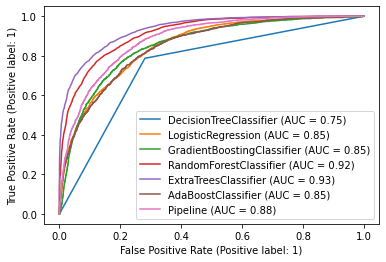

In [201]:
from sklearn.metrics import plot_roc_curve

disp = plot_roc_curve(clf, x_train, y_train)

plot_roc_curve(grid_log_best, x_train, y_train, ax=disp.ax_)
plot_roc_curve(grid_gbdt_best, x_train, y_train, ax=disp.ax_)
plot_roc_curve(grid_rf_best, x_train, y_train, ax=disp.ax_)
plot_roc_curve(grid_etc_best, x_train, y_train, ax=disp.ax_)
plot_roc_curve(grid_ada_best, x_train, y_train, ax=disp.ax_)
plot_roc_curve(svm_best, x_train, y_train, ax=disp.ax_)

plt.legend(prop = {'size':10}, loc='lower right')
plt.show()

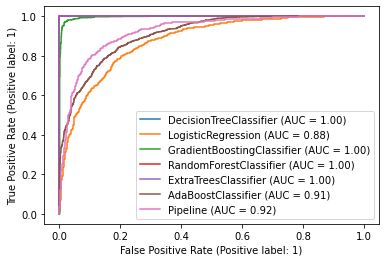

In [202]:
from sklearn.metrics import plot_roc_curve

disp = plot_roc_curve(clf, x_test, y_test)

plot_roc_curve(grid_log_best, x_test, y_test, ax=disp.ax_)
plot_roc_curve(grid_gbdt_best, x_test, y_test, ax=disp.ax_)
plot_roc_curve(grid_rf_best,x_test, y_test, ax=disp.ax_)
plot_roc_curve(grid_etc_best, x_test, y_test, ax=disp.ax_)
plot_roc_curve(grid_ada_best, x_test, y_test, ax=disp.ax_)
plot_roc_curve(svm_best,x_test, y_test, ax=disp.ax_)

plt.legend(prop = {'size':10}, loc='lower right')
plt.show()

In [203]:
# Observations:

# Here ExtraTreesClassifier gives best AUC score for training and testing dataset. 
#So it is the final model for this dataset.

In [208]:
grid_etc_best.fit(x_train, y_train)
y_pred = grid_etc_best.predict(x_test)

print('accu score : ', accuracy_score(y_test, y_pred))
print("\n")
print ('cof_mat: ', confusion_matrix(y_test, y_pred))
print("\n")
print('classification report: \n', classification_report(y_test, y_pred))

print("-----------")
print("-----------")


print('training score : ', grid_etc_best.score(x_train, y_train))
print('testing score : ', grid_etc_best.score(x_test, y_test))

accu score :  0.9315512353179425


cof_mat:  [[1134  110]
 [  59 1166]]


classification report: 
               precision    recall  f1-score   support

           0       0.95      0.91      0.93      1244
           1       0.91      0.95      0.93      1225

    accuracy                           0.93      2469
   macro avg       0.93      0.93      0.93      2469
weighted avg       0.93      0.93      0.93      2469

-----------
-----------
training score :  1.0
testing score :  0.9315512353179425


# confusion matrix

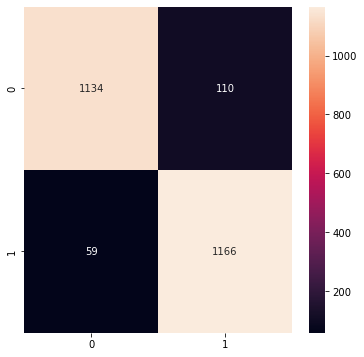

In [209]:
conf = confusion_matrix (y_test, y_pred)

fig , ax = plt.subplots(figsize=(6,6))
sns.heatmap(conf, annot = True, fmt = ".0f")
plt.show()

# Load the model:

In [210]:
import pickle
pickle.dump(grid_etc_best, open("Raining_Tomorrow_Classification_model", "wb"))
load_Raining_Tomorrow_Classification_model= pickle.load(open("Raining_Tomorrow_Classification_model", "rb"))


In [211]:
y_pred = load_Raining_Tomorrow_Classification_model.predict(x_test)

y_test = np.array(y_test)
data_prediction_by_model = pd.DataFrame()
data_prediction_by_model["Predicted Values"] = y_pred
data_prediction_by_model["Actual Values"] = y_test
data_prediction_by_model.sample(n=6)

,Predicted Values,Actual Values
1589,1,1
1859,1,1
240,0,0
1975,1,1
1883,1,1
1079,0,0


# For Rainfall: (Target 2)

# Principal Component Analysis (PCA) for Rainfall (target2):

In [212]:
# Splitting data in target and features
x = df.drop(['Rainfall'], axis =1)
y = df['Rainfall']


In [213]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
pca = PCA()
scaler= StandardScaler()
x_scale = scaler.fit_transform(x)


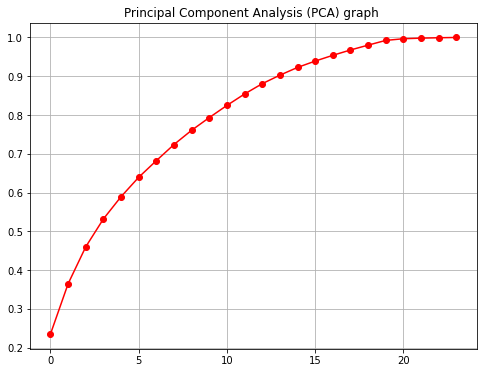

In [214]:
x_pca = pca.fit_transform(x_scale)
plt.figure(figsize=(8,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), 'ro-')
plt.title('Principal Component Analysis (PCA) graph ')
plt.grid()

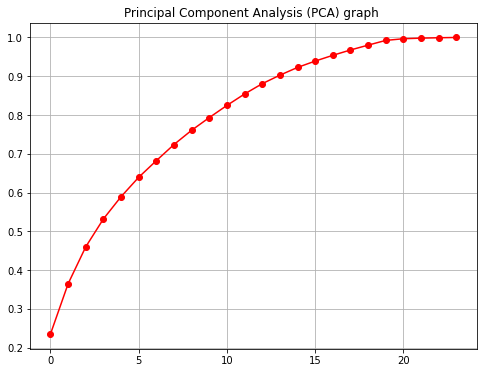

In [215]:
x_pca = pca.fit_transform(x_scale)
plt.figure(figsize=(8,6))
plt.plot(np.cumsum(pca.explained_variance_ratio_), 'ro-')
plt.title('Principal Component Analysis (PCA) graph ')
plt.grid()

In [216]:
# Observations:

# Here , around 100% variance gives the first 18 component. Let's take the first 18 components.

In [217]:
pca_new = PCA(n_components=18)
x_scale_new = pca_new.fit_transform(x_scale)
prin_x=pd.DataFrame(x_scale_new )
prin_x.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0.438399,1.481065,2.568651,-2.760534,-0.518045,0.848781,-0.880574,-2.048714,0.382391,0.098396,-0.285396,-0.936250,-0.377667,0.132550,0.715525,-1.107523,-0.564721,-0.589158
1,0.723134,-0.041671,2.284611,-2.795278,-0.598141,1.805511,-1.197102,-1.951004,-0.205048,0.819666,-0.065682,0.365748,-0.360321,0.077820,0.251895,0.269751,-0.463495,0.396416
2,1.645901,0.658135,3.342280,-3.033464,-0.471122,0.593203,-0.343698,-1.637346,0.574524,-0.061865,-0.344585,0.108539,-0.458690,-0.242831,0.053024,-0.720944,0.063462,0.250801
3,0.689079,-1.699633,0.017446,-1.793467,-2.510215,0.429092,-0.703834,-1.689618,1.291667,-0.434946,-0.933064,-0.375738,1.051904,0.912332,-0.083279,-0.188224,-0.516531,0.039352
4,1.183925,1.497921,-0.330668,-2.175211,-1.664565,1.252765,-1.728037,-1.680988,-0.162646,1.255682,-0.154612,-0.514156,-1.147017,1.363865,0.356928,0.659869,-0.455814,-0.448976


# Final predictions using different Regression ML Models for Rainfall (target2):

# Find best Random state:

In [218]:
from sklearn.linear_model import LinearRegression

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

r2_max=0
random_max=0
for i in range(1000,3000):
    x_train,x_test,y_train,y_test = train_test_split(x_scale_new,y,test_size = 0.25, random_state=i)
    lin_reg= LinearRegression()
    
    lin_reg.fit(x_train,y_train)
    y_pred=lin_reg.predict(x_test)
    r2 = r2_score(y_test,y_pred)
    
    if r2>r2_max:
        r2_max=r2
        random_max=i
print('Best accuracy is', r2_max ,'on Random_state', random_max)


Best accuracy is 0.7815011677141493 on Random_state 1984


In [219]:
print('Training feature shape:',x_train.shape)
print('Training target shape:',y_train.shape)
print('Test feature shape:',x_test.shape)
print('Test target shape:',y_test.shape)

Training feature shape: (4644, 18)
Training target shape: (4644,)
Test feature shape: (1548, 18)
Test target shape: (1548,)


In [220]:
# Observations:

# For random state=1984, the accuracy score is best. Lets take this random state for further steps.

# Using LinearRegression()

In [221]:
x_train,x_test,y_train,y_test = train_test_split(x_scale_new,y,test_size = 0.25, random_state=1984)

lin_reg= LinearRegression()

lin_reg.fit(x_train, y_train)

y_pred = lin_reg.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.7815011677141493
Mean absolute error: 0.32366948456724454
Mean square error: 0.22123965041972057
Root mean square error: 0.47036119144729677


# Using GridSearchCV:

In [222]:
from sklearn.model_selection import GridSearchCV

grid = dict(fit_intercept=['True', 'False'], n_jobs=[1,-1])

grid_lin = GridSearchCV(estimator=lin_reg, param_grid= grid, cv=9)

grid_lin.fit(x_train, y_train)
grid_lin.best_params_

{'fit_intercept': 'True', 'n_jobs': 1}

In [223]:
grid_lin_best = LinearRegression(fit_intercept= 'True', n_jobs= 1)

grid_lin_best.fit(x_train, y_train)
y_pred = grid_lin_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.7815011677141493
Mean absolute error: 0.32366948456724454
Mean square error: 0.22123965041972057
Root mean square error: 0.47036119144729677


In [224]:
# Observations:

# No such improvement seen after GridSearchCV.

# Using DecisionTreeRegressor():

In [225]:
from sklearn.tree import DecisionTreeRegressor

dt = DecisionTreeRegressor()
dt.fit(x_train, y_train)

y_pred = dt.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.536517034295963
Mean absolute error: 0.31280719157190995
Mean square error: 0.4692968298050568
Root mean square error: 0.6850524285082543


# Using GridSearchCV:

In [226]:
param = {'criterion' : ["squared_error", "friedman_mse", "absolute_error"],
    'min_samples_split' : range(1,4),
    'splitter' : ["best", "random"]}

grid_search = GridSearchCV(estimator = dt,cv=5,param_grid = param)
grid_search.fit(x_train, y_train)

print("Best Parameters:" , grid_search.best_params_)

Best Parameters: {'criterion': 'squared_error', 'min_samples_split': 3, 'splitter': 'best'}


In [227]:
grid_dt_best = grid_search.best_estimator_
grid_dt_best.fit(x_train, y_train)

y_pred = grid_dt_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.5310305298305935
Mean absolute error: 0.318527578284169
Mean square error: 0.47485215619854804
Root mean square error: 0.6890951720905815


In [228]:
# Observations:

# No improvements in the score

# Using KNeighborsRegressor():

In [229]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn import neighbors
rmse_val = []
for i in range(0,20):
    i = i+1
    knn = neighbors.KNeighborsRegressor(n_neighbors = i)

    knn.fit(x_train,y_train) 
    y_pred=knn.predict(x_test) 
    error =np. sqrt(mean_squared_error(y_test,y_pred)) 
    rmse_val.append(error) 
    print('RMSE value for k= ' , i , 'is:', error)

RMSE value for k=  1 is: 0.6744596997645227
RMSE value for k=  2 is: 0.5935977968464208
RMSE value for k=  3 is: 0.565826200817698
RMSE value for k=  4 is: 0.5535054482521916
RMSE value for k=  5 is: 0.5500882411979238
RMSE value for k=  6 is: 0.5471731218434215
RMSE value for k=  7 is: 0.5434716850079856
RMSE value for k=  8 is: 0.5457174742382827
RMSE value for k=  9 is: 0.5451820429498071
RMSE value for k=  10 is: 0.5463406393423283
RMSE value for k=  11 is: 0.5438826432771919
RMSE value for k=  12 is: 0.5458418382586252
RMSE value for k=  13 is: 0.5472317972996005
RMSE value for k=  14 is: 0.5492242104829649
RMSE value for k=  15 is: 0.550134258968902
RMSE value for k=  16 is: 0.5520107906893423
RMSE value for k=  17 is: 0.5527659991649954
RMSE value for k=  18 is: 0.5532019532646302
RMSE value for k=  19 is: 0.5546409375101667
RMSE value for k=  20 is: 0.5557268869138297


In [230]:
min(rmse_val)

0.5434716850079856

# For k=7 we get the best RMSE value for KNeighborsRegressor()

In [231]:
knn =KNeighborsRegressor(n_neighbors= 7)
knn.fit(x_train, y_train)

y_pred = knn.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.7082976008126027
Mean absolute error: 0.32942967935725864
Mean square error: 0.2953614724054191
Root mean square error: 0.5434716850079856


# Using GridSearchCV

In [232]:
param = {'algorithm' : ['auto', 'ball_tree', 'kd_tree'],
             'leaf_size' : [30,40,25,34],
             'n_neighbors' : [7],'weights': ['uniform', 'distance'], 'p':[1,2,3]}
    

gridsearchknn = GridSearchCV(estimator = knn, param_grid=param, cv=5)

gridsearchknn.fit(x_train, y_train) 

print("Best Parameters:" , gridsearchknn.best_params_)

Best Parameters: {'algorithm': 'auto', 'leaf_size': 30, 'n_neighbors': 7, 'p': 3, 'weights': 'distance'}


In [233]:
grid_knn_best = gridsearchknn.best_estimator_

grid_knn_best.fit(x_train, y_train)

y_pred = grid_knn_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.7091719845657558
Mean absolute error: 0.3280120440970285
Mean square error: 0.2944761205073953
Root mean square error: 0.5426565400945568


In [234]:
# Observations:

# R2 Score and RMSE are slightly improved after GridSearchCV.

# Using RandomForestRegressor():

In [235]:
from sklearn.ensemble import RandomForestRegressor

rf= RandomForestRegressor()
rf.fit(x_train, y_train)

y_pred = rf.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.7578245036803538
Mean absolute error: 0.327834902446017
Mean square error: 0.24521331114431985
Root mean square error: 0.4951901767445714


# Using GridSearchCV:

In [236]:
params = {'n_estimators' : [100,110,80], 'criterion' : ["squared_error", "absolute_error"]}

rf_grd = GridSearchCV(rf, param_grid = params, cv=5)
rf_grd.fit(x_train, y_train)
print('best params : ', rf_grd.best_params_)

best params :  {'criterion': 'squared_error', 'n_estimators': 110}


In [237]:
grid_rf_best = rf_grd.best_estimator_

grid_rf_best.fit(x_train, y_train)

y_pred = grid_rf_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))




R2 Score: 0.7566987511059446
Mean absolute error: 0.3269578126999606
Mean square error: 0.24635318499817893
Root mean square error: 0.4963397878451605


In [238]:
# Observations:

# r2 score, RMSE are not improved after GridSearchCV.

# Using Support Vector Regression():

In [239]:
from sklearn.svm import SVR
svr_rbf = SVR(kernel='rbf')
svr_rbf.fit(x_train, y_train)

y_pred = svr_rbf.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))

R2 Score: 0.7773232320753305
Mean absolute error: 0.2550308773148581
Mean square error: 0.22546999348626443


In [240]:
from sklearn.svm import SVR
svr_poly = SVR(kernel='poly')
svr_poly.fit(x_train, y_train)

y_pred = svr_poly.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))

R2 Score: 0.7505674437743177
Mean absolute error: 0.2756960054735427
Mean square error: 0.25256140257295473


In [241]:
from sklearn.svm import SVR
svr_lin = SVR(kernel='linear', )
svr_lin.fit(x_train, y_train)

y_pred = svr_lin.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))

R2 Score: 0.7537489575438121
Mean absolute error: 0.23189059093759967
Mean square error: 0.24933998034929902


# Using GridSearchCV:

In [242]:
params = {'gamma':['scale', 'auto'],'C':[1.0,0.1], 'tol':[0.01,0.1], 'kernel':['rbf']}

svr_grd = GridSearchCV(svr_lin, param_grid = params, cv=5)
svr_grd.fit(x_train, y_train)
print('best params : ', svr_grd.best_params_)

best params :  {'C': 1.0, 'gamma': 'auto', 'kernel': 'rbf', 'tol': 0.01}


In [243]:
grid_svr_best = svr_grd.best_estimator_
grid_svr_best.fit(x_train, y_train)

y_pred = grid_svr_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.7775810681311013
Mean absolute error: 0.26737185494194116
Mean square error: 0.22520892317184882
Root mean square error: 0.4745618222864633


In [244]:
# Observations:

# r2 score, RMSE are improved after using hyperparameter.

# Using GradientBoostingRegressor()

In [245]:
from sklearn.ensemble import  GradientBoostingRegressor

gbdt= GradientBoostingRegressor()
gbdt.fit(x_train, y_train)

y_pred = gbdt.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.7594776786635016
Mean absolute error: 0.34799481624084816
Mean square error: 0.2435393989703832
Root mean square error: 0.4934971114103741


# Using GridSearchCV:

In [246]:
params = {'loss': ['squared_error', 'absolute_error'], 'n_estimators':[100,150,80], 'max_features': ['auto', 'sqrt']}

gbdt_grd = GridSearchCV(gbdt, param_grid = params, cv=5)
gbdt_grd.fit(x_train, y_train)
print('best params : ', gbdt_grd.best_params_)

best params :  {'loss': 'squared_error', 'max_features': 'sqrt', 'n_estimators': 150}


In [247]:
grid_gbdt_best = gbdt_grd.best_estimator_

grid_gbdt_best.fit(x_train, y_train)

y_pred = grid_gbdt_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.7668809579250695
Mean absolute error: 0.3437143256038585
Mean square error: 0.23604325403151197
Root mean square error: 0.48584282852740757


In [248]:
# Observations:

# r2 score, RMSE are improved after GridSearchCV.

# Using AdaBoostRegressor():

In [249]:
from sklearn.ensemble import AdaBoostRegressor

ada= AdaBoostRegressor()
ada.fit(x_train, y_train)

y_pred = ada.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.30056761881306926
Mean absolute error: 0.7932455987946019
Mean square error: 0.7082059610441679
Root mean square error: 0.8415497377126131


# Using GridSearchCV:

In [250]:
params = { 'loss' : ['linear', 'square'], 'learning_rate': [0.1,0.01,1] ,
        'n_estimators':[50,90,40] }

ada_grd = GridSearchCV(ada, param_grid = params, cv=5)
ada_grd.fit(x_train, y_train)
print('best params : ', ada_grd.best_params_)

best params :  {'learning_rate': 0.1, 'loss': 'linear', 'n_estimators': 40}


In [251]:
grid_ada_best = ada_grd.best_estimator_

grid_ada_best.fit(x_train, y_train)

y_pred = grid_ada_best.predict(x_test)

print('R2 Score:', r2_score(y_test, y_pred))
print('Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('Mean square error:', mean_squared_error(y_test, y_pred))
print('Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

R2 Score: 0.6655315705873077
Mean absolute error: 0.48453442632471405
Mean square error: 0.3386639536036043
Root mean square error: 0.5819484114623944


In [252]:
# Observations:

# r2 score, RMSE are improved after GridSearchCV

# As per 7 different regression model we can see that the model with maximum R2 score and minimum RMSE value is LinearRegression().

In [253]:
# Let's check the cross validation score before final prediction.

# Cross Validation:

In [254]:
from sklearn.model_selection import cross_val_score

all_models = [lin_reg , dt , grid_knn_best , rf , grid_svr_best , grid_gbdt_best, grid_ada_best]

for i in all_models:
    cvscore = cross_val_score(i, x_scale,y, cv = 5)
    print('Cross Validation Score of :',i)
    print("\n Cross Validation Score : " ,cvscore)
    print("\nMean CV Score :",cvscore.mean())
    print("\nStd deviation :",cvscore.std())
    print("\n-----------")
    print("-----------")

Cross Validation Score of : LinearRegression()

 Cross Validation Score :  [0.78739529 0.69639888 0.70473493 0.69194174 0.79245699]

Mean CV Score : 0.7345855666411045

Std deviation : 0.04539988530521028

-----------
-----------
Cross Validation Score of : DecisionTreeRegressor()

 Cross Validation Score :  [0.46145128 0.47786028 0.26174123 0.35793867 0.47358605]

Mean CV Score : 0.40651550398018166

Std deviation : 0.08476529274353681

-----------
-----------
Cross Validation Score of : KNeighborsRegressor(n_neighbors=7, p=3, weights='distance')

 Cross Validation Score :  [0.74254678 0.67117621 0.64235723 0.64488249 0.75731537]

Mean CV Score : 0.6916556157359459

Std deviation : 0.04886425222174985

-----------
-----------
Cross Validation Score of : RandomForestRegressor()

 Cross Validation Score :  [0.75914931 0.69362905 0.66146304 0.67825051 0.78101464]

Mean CV Score : 0.7147013079914388

Std deviation : 0.04686170344458893

-----------
-----------
Cross Validation Score of : 

In [255]:
# Observations:

# Here also LinearRegression is the best model with max cv score and min std.

In [256]:
from sklearn.linear_model import Ridge, Lasso, RidgeCV, LassoCV
#LASSO Regression

lassocv= LassoCV()
lassocv.fit(x_train, y_train)
alpha= lassocv.alpha_   #best learning rate for LASSO
alpha  


0.0014165868230415922

In [257]:
lasso_reg=Lasso(alpha)
lasso_reg.fit(x_train,y_train)
print ("Score after applying LASSO regression on the model is :", lasso_reg.score(x_test, y_test))

Score after applying LASSO regression on the model is : 0.7810324952865759


In [258]:
#RIDGE Regression

ridgecv= RidgeCV(alphas=np.arange(0.0001, 1.0, 0.001),  normalize= True, cv=10 )
ridgecv.fit(x_train, y_train)
alpha= ridgecv.alpha_   #best learning rate for RIDGE
alpha  


0.0011

In [259]:
ridge_reg=Ridge(alpha)
ridge_reg.fit(x_train,y_train)
print ("Score after applying LASSO regression on the model is :", ridge_reg.score(x_test, y_test))

Score after applying LASSO regression on the model is : 0.7815011592057386


In [260]:
# Observations:

# After using LASSO() and Ridge(), there is no large change in score. So this model is not OVERFITTED.

# Conclusion:

# Our final model is LinearRegression() for this particular dataset for calculating Rainfall.


# Final Model:

In [261]:
y_pred = lin_reg.predict(x_test)
y_pred

array([-0.47058471,  1.77698176, -0.30702093, ...,  1.92213149,
       -0.29536134, -0.30748222])

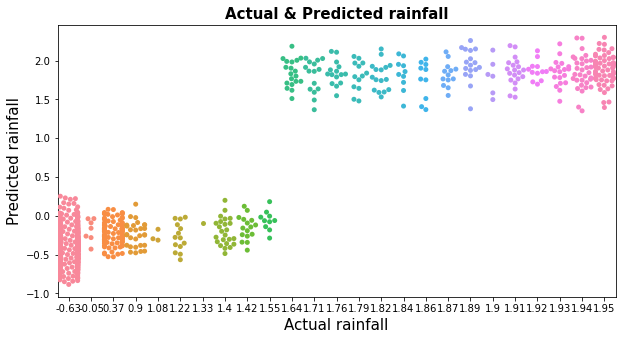

In [262]:
# Let's visualize the variation of actual test data and predicted data
plt.figure(figsize=(10,5))
sns.swarmplot(y_test.round(2), y_pred)
plt.xlabel("Actual rainfall", fontsize= 15)
plt.ylabel("Predicted rainfall",fontsize= 15)
plt.title("Actual & Predicted rainfall" , fontsize= 15, fontweight= 'bold')
plt.show()

In [263]:
print('Final R2 Score:', r2_score(y_test, y_pred))
print('\nFinal Mean absolute error:', mean_absolute_error(y_test, y_pred))
print('\nFinal Mean square error:', mean_squared_error(y_test, y_pred))
print('\nFinal Root mean square error:',np.sqrt( mean_squared_error(y_test, y_pred)))

Final R2 Score: 0.7815011677141493

Final Mean absolute error: 0.32366948456724454

Final Mean square error: 0.22123965041972057

Final Root mean square error: 0.47036119144729677


# Load and save the model

In [264]:
# Now , let's save the model for future use.

In [265]:
import pickle
pickle.dump(lin_reg, open("Rainfall_Regression_model", "wb"))
load_Rainfall_Regression_model= pickle.load(open("Rainfall_Regression_model", "rb"))